<a href="https://colab.research.google.com/github/boesuwanan/Google-Advanced-Data-Analytics-Professional-Certificate/blob/main/%5BSR%5D_visualization.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

##data


In [ ]:
!pip install -q expectexception

In [ ]:
import expectexception

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

url = 'https://docs.google.com/spreadsheets/d/1YtVxs2QjED_vGp2OOBuhRmhfd6yiv6ci/export?gid=1325596702&format=csv'
raw_df = pd.read_csv(url)

df = raw_df.drop(["DATES","year helper"], axis='columns')

df.head(3)

,ID,sector,year,stringency_index,esg_OVERALL,esg_E,esg_S,esg_G,RETURN,VOLATILITY_260D_CALC,...,LIQUIDITY,ln_liq,BS_TOT_ASSET,ln_t_asset,RETURN_ON_ASSET,TOT_DEBT_TO_COM_EQY,ln_debt,PX_TO_BOOK_RATIO,ln_ptb,SALES_GROWTH
0,AAV TB Equity,Industrials,2022,27.037096,3.11,1.77,4.21,3.86,0.19,32.209,...,615702.09,13.33,64685.5240,11.077293,-11.8180,540.7356,6.292930,4.6795,1.5432,358.4937
1,AAV TB Equity,Industrials,2021,55.726767,3.70,3.04,4.66,3.34,0.12,47.934,...,1143176.44,13.95,71208.3295,11.173365,-9.5519,223.0583,5.407433,1.2421,0.2168,-71.9194
2,ACE TB Equity,Utilities,2022,27.037096,3.28,2.16,3.69,5.05,-0.26,23.489,...,515610.74,13.15,20071.1418,9.907038,6.6062,35.9278,3.581511,1.9451,0.6653,20.7807


In [ ]:
df.describe()

,year,stringency_index,esg_OVERALL,esg_E,esg_S,esg_G,RETURN,VOLATILITY_260D_CALC,ln_vol,LIQUIDITY,ln_liq,BS_TOT_ASSET,ln_t_asset,RETURN_ON_ASSET,TOT_DEBT_TO_COM_EQY,ln_debt,PX_TO_BOOK_RATIO,ln_ptb,SALES_GROWTH
count,444.000000,444.000000,444.000000,444.000000,444.000000,444.000000,444.000000,444.000000,444.000000,4.440000e+02,444.000000,4.440000e+02,444.000000,444.000000,444.000000,444.000000,444.000000,444.000000,444.000000
mean,2019.306306,23.998175,3.042027,2.142725,3.338041,4.422297,0.058649,32.329660,3.407703,1.108002e+06,13.610315,4.360074e+05,11.605243,5.426285,122.922631,4.325017,3.169994,0.790342,11.551291
std,2.259838,23.931296,1.332718,2.013001,2.076308,0.764919,0.303118,13.032069,0.360978,9.681652e+05,0.887641,8.666157e+05,1.699463,6.748506,118.863820,1.289194,2.843622,0.852510,35.651308
min,2015.000000,0.000000,0.560000,0.000000,0.000000,1.810000,-1.110000,12.048000,2.490000,5.425510e+03,8.600000,8.973697e+02,6.799468,-20.845100,0.047100,-3.055482,0.301800,-1.198000,-85.268300
25%,2017.000000,0.000000,2.007500,0.160000,1.652500,3.910000,-0.120000,23.705000,3.167500,5.613537e+05,13.240000,3.601183e+04,10.491603,1.663900,53.344150,3.976743,1.107500,0.102075,-4.643725
50%,2020.000000,27.037096,2.890000,1.760000,3.140000,4.370000,0.040000,29.338000,3.380000,8.676029e+05,13.675000,1.026898e+05,11.539462,4.845800,93.171550,4.534412,1.846850,0.613450,6.816700
75%,2021.000000,46.500083,3.835000,3.745000,4.652500,4.930000,0.230000,37.874500,3.632500,1.345182e+06,14.110000,3.040882e+05,12.625065,8.125600,159.654850,5.073014,4.712700,1.550250,19.800400
max,2022.000000,55.726767,6.590000,8.640000,9.700000,6.320000,1.450000,113.835000,4.730000,9.270803e+06,16.040000,4.421752e+06,15.302047,63.393100,1263.813800,7.141889,18.562500,2.921100,358.493700


In [ ]:
df.shape

(444, 21)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 444 entries, 0 to 443
Data columns (total 21 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   ID                    444 non-null    object 
 1   sector                444 non-null    object 
 2   year                  444 non-null    int64  
 3   stringency_index      444 non-null    float64
 4   esg_OVERALL           444 non-null    float64
 5   esg_E                 444 non-null    float64
 6   esg_S                 444 non-null    float64
 7   esg_G                 444 non-null    float64
 8   RETURN                444 non-null    float64
 9   VOLATILITY_260D_CALC  444 non-null    float64
 10  ln_vol                444 non-null    float64
 11  LIQUIDITY             444 non-null    float64
 12  ln_liq                444 non-null    float64
 13  BS_TOT_ASSET          444 non-null    float64
 14  ln_t_asset            444 non-null    float64
 15  RETURN_ON_ASSET       4

In [ ]:
df.dtypes

ID                       object
sector                   object
year                      int64
stringency_index        float64
esg_OVERALL             float64
esg_E                   float64
esg_S                   float64
esg_G                   float64
RETURN                  float64
VOLATILITY_260D_CALC    float64
ln_vol                  float64
LIQUIDITY               float64
ln_liq                  float64
BS_TOT_ASSET            float64
ln_t_asset              float64
RETURN_ON_ASSET         float64
TOT_DEBT_TO_COM_EQY     float64
ln_debt                 float64
PX_TO_BOOK_RATIO        float64
ln_ptb                  float64
SALES_GROWTH            float64
dtype: object

In [ ]:
df['sector'].value_counts(dropna=False)

Financials                95
Real Estate               56
Utilities                 44
Consumer Staples          41
Energy                    36
Industrials               35
Consumer Discretionary    35
Materials                 33
Communication Services    31
Health Care               27
Information Technology    11
Name: sector, dtype: int64

In [ ]:
df['quintiles'] = pd.qcut(df['esg_OVERALL'], 5 , labels=(range(1,6)))

# sector

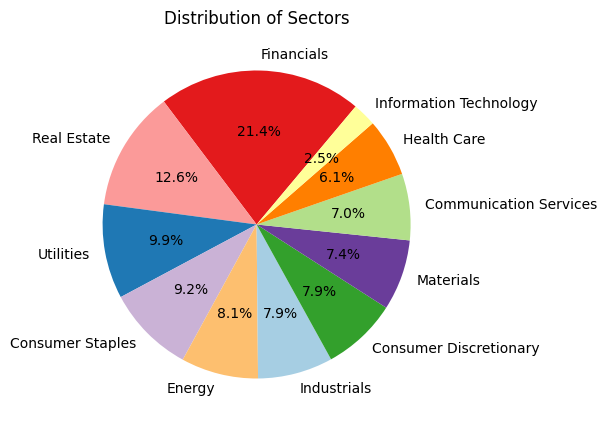

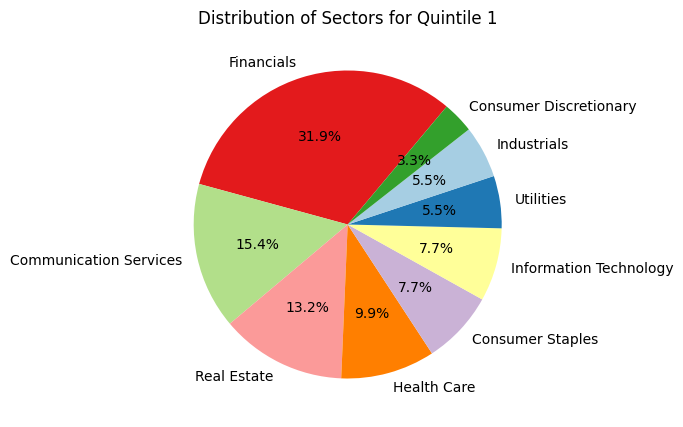

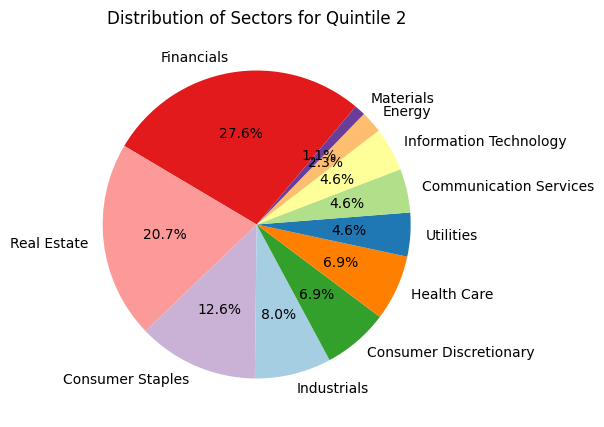

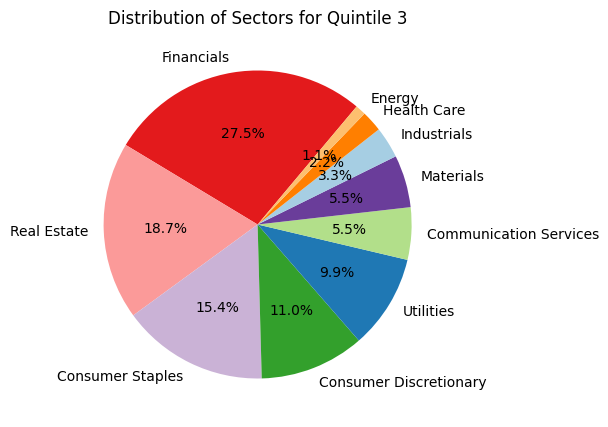

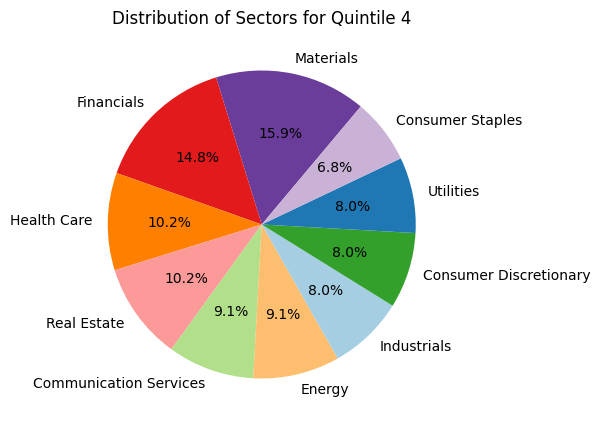

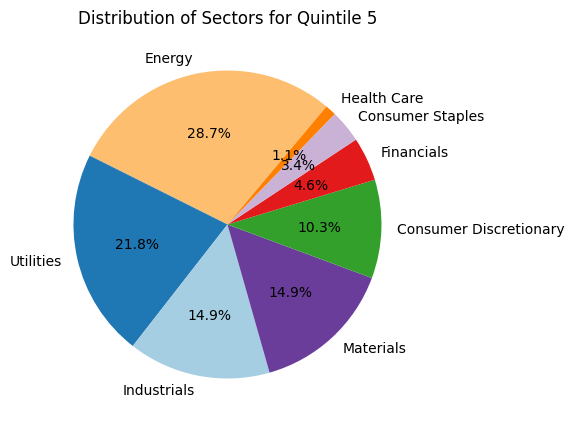

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns

colors = sns.color_palette("Paired", 11)

# Create a dictionary to map sectors to colors
sector_color_dict = dict(zip(df['sector'].unique(), colors))

# Pie for sample sector
sector_counts = df['sector'].value_counts(dropna=False)
plt.figure(figsize=(5, 5))
plt.pie(sector_counts, labels=sector_counts.index, autopct='%1.1f%%', startangle=50, colors=[sector_color_dict[sector] for sector in sector_counts.index])
plt.title('Distribution of Sectors')
plt.show()

# Plot pie charts for each quintile
for q in range(1, 6):
    sector_q = df[df['quintiles'] == q]['sector'].value_counts()

    plt.figure(figsize=(5, 5))
    plt.pie(sector_q, labels=sector_q.index, autopct='%1.1f%%', startangle=50, colors=[sector_color_dict[sector] for sector in sector_q.index])
    plt.title(f'Distribution of Sectors for Quintile {q}')
    plt.show()


##plot esg

###Pillars for each sector

In [ ]:
sectors = [
    'Financials',
    'Real Estate',
    'Consumer Discretionary',
    'Industrials',
    'Energy',
    'Utilities',
    'Consumer Staples',
    'Materials',
    'Health Care',
    'Communication Services',
    'Information Technology'
]

sector_data = {i: df[df["sector"] == i] for i in sectors}

#ie.
#sector_data['Energy']

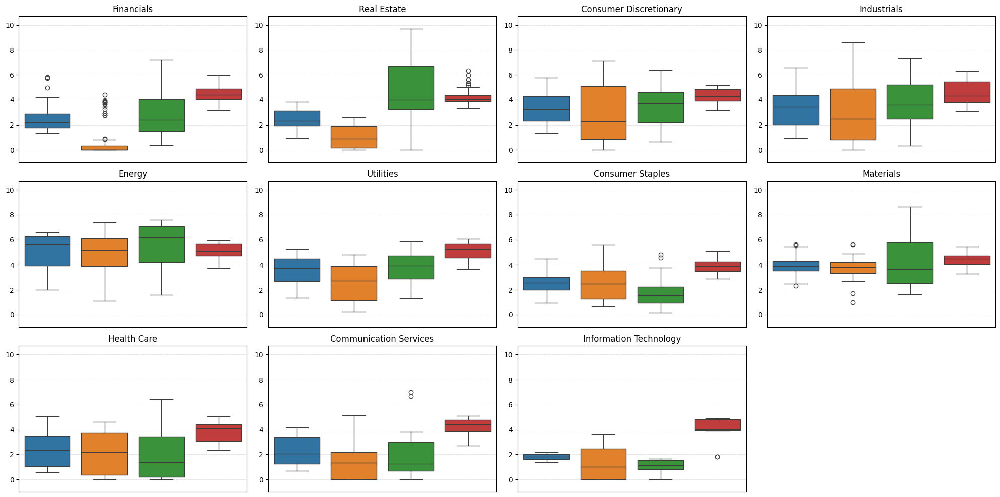

In [ ]:

fig, axs = plt.subplots(3,4, figsize=(20, 10))
axs = axs.flatten()           # Flatten the axs array since you have 3x4 subplots

axs[11].axis('off')

# Combine all data to find common y-axis limits
all_data = []
for sector in sectors:
    all_data.extend(sector_data[sector][['esg_OVERALL', 'esg_E', 'esg_S', 'esg_G']].values.flatten())

# Calculate common y-axis limits
y_min = min(all_data)
y_max = max(all_data)

# Iterate through sectors and plot boxplots
for i, sector in enumerate(sectors):
    sns.boxplot(data=sector_data[sector][['esg_OVERALL', 'esg_E', 'esg_S', 'esg_G']], ax=axs[i])
    axs[i].set_title(sector)
    axs[i].get_xaxis().set_visible(False)
    axs[i].set_ylim(y_min -1 , y_max + 1)  # Set common y-axis limits

    # Show gridlines and bold the zero line
    axs[i].grid(True, linestyle='--', linewidth=0.5, color='lightgray')

plt.tight_layout()            # Adjust layout for better spacing
plt.show()

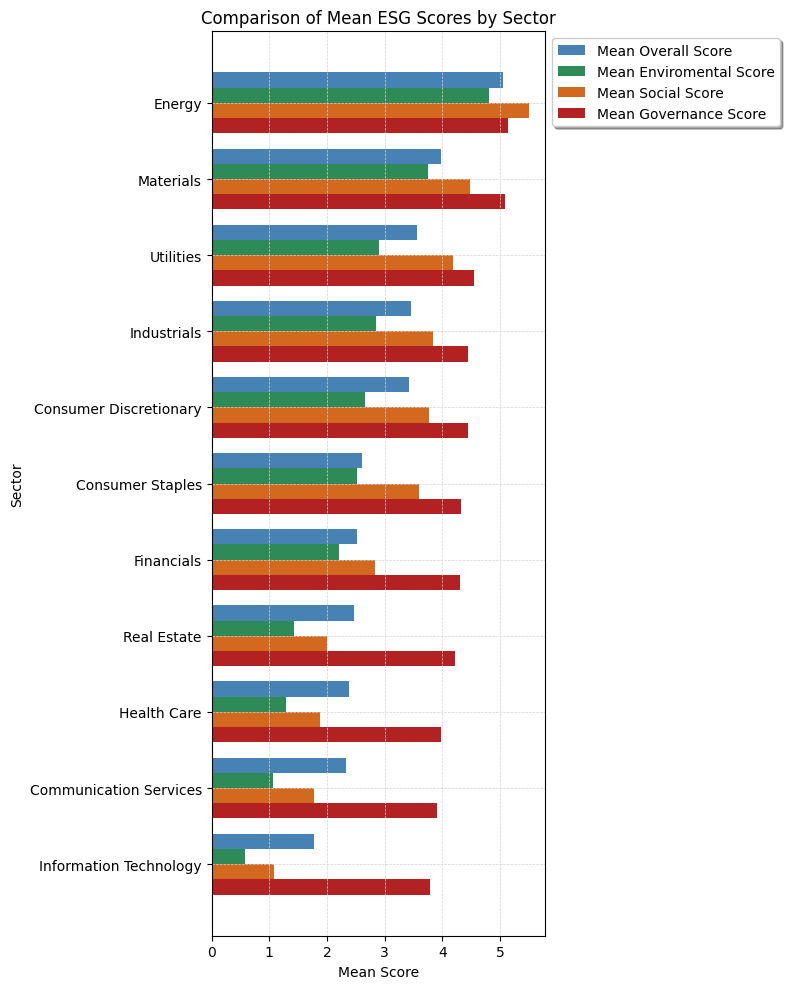

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Calculate mean values for esg_OVERALL, esg_E, esg_S, and esg_G by sector
esg_overall_mean = df.groupby('sector')['esg_OVERALL'].mean().sort_values()
esg_e_mean = df.groupby('sector')['esg_E'].mean().sort_values()
esg_s_mean = df.groupby('sector')['esg_S'].mean().sort_values()
esg_g_mean = df.groupby('sector')['esg_G'].mean().sort_values()

# Plotting
fig, ax = plt.subplots(figsize=(8, 10))  # Increase the figure size
bar_width = 0.2  # Decrease the bar width
index = np.arange(len(esg_overall_mean))

ax.barh(index + (bar_width * 3), esg_overall_mean, bar_width, color='SteelBlue', label='Mean esg_OVERALL')
ax.barh(index + (bar_width * 2), esg_e_mean, bar_width, color='SeaGreen', label='Mean esg_E')
ax.barh(index + (bar_width), esg_s_mean, bar_width, color='Chocolate', label='Mean esg_S')
ax.barh(index, esg_g_mean, bar_width, color='FireBrick', label='Mean esg_G')  # Changed color for esg_G

ax.set_yticks(index + (bar_width * 1.5))  # Adjusted the yticks position
ax.set_yticklabels(esg_overall_mean.index)

# Set plot title and labels
ax.set_title('Comparison of Mean ESG Scores by Sector')
ax.set_xlabel('Mean Score')
ax.set_ylabel('Sector')
ax.grid(True, linestyle='--', linewidth=0.5, color='lightgray')
ax.legend(['Mean Overall Score', 'Mean Enviromental Score', 'Mean Social Score', 'Mean Governance Score'], loc='upper left', bbox_to_anchor=(1, 1),
          ncol=1, fancybox=True, shadow=True)

plt.tight_layout()  # Adjust layout to prevent cropping
#plt.legend(['Mean Overall Score', 'Mean Enviromental Score', 'Mean Social Score', 'Mean Governance Score'])
plt.show()


#quintiles

In [ ]:
df['quintiles'] = pd.qcut(df['esg_OVERALL'], 5 , labels=(range(1,6)))
df[['quintiles', 'esg_OVERALL', 'RETURN']]

,quintiles,esg_OVERALL,RETURN
0,3,3.11,0.19
1,4,3.70,0.12
2,3,3.28,-0.26
3,3,3.28,-0.04
4,4,3.46,0.26
...,...,...,...
439,4,3.64,0.01
440,3,2.41,-0.08
441,2,2.23,-0.01
442,2,2.19,-0.36


##return

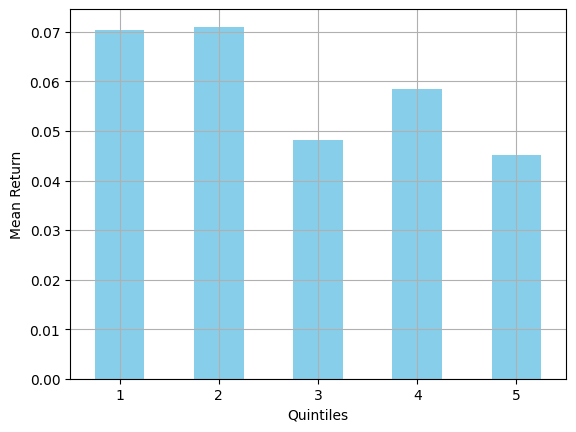

In [ ]:
df.groupby('quintiles')['RETURN'].mean().plot(kind='bar', grid='true', color='skyblue')

plt.xlabel('Quintiles')
plt.ylabel('Mean Return')
plt.xticks(range(5), range(1, 6), rotation=0)

plt.show()


##voliatility

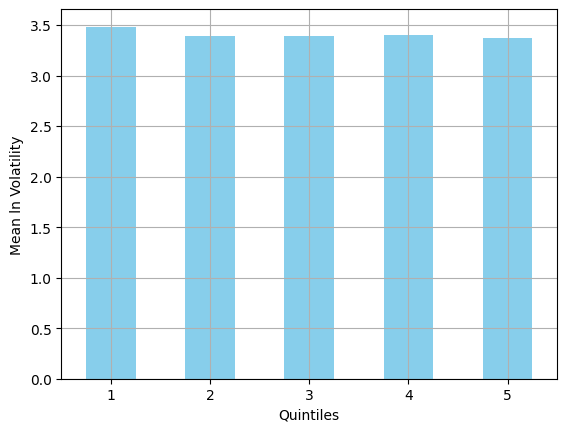

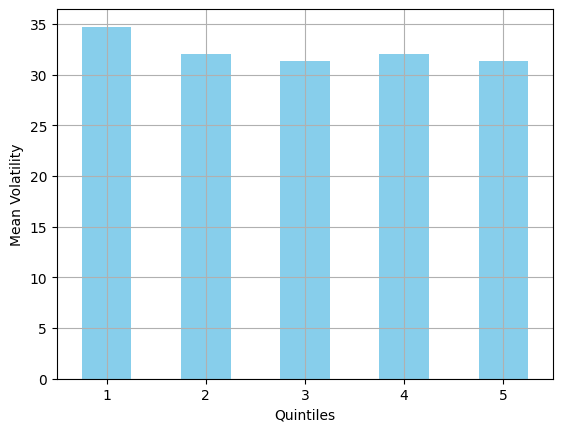

In [ ]:
df.groupby('quintiles')['ln_vol'].mean().plot(kind='bar', color='skyblue', grid='true')
plt.xlabel('Quintiles')
plt.ylabel('Mean ln Volatility')
plt.xticks(range(5), range(1, 6), rotation=0)
plt.show()

######
df.groupby('quintiles')['VOLATILITY_260D_CALC'].mean().plot(kind='bar', color='skyblue', grid='true')
plt.xlabel('Quintiles')
plt.ylabel('Mean Volatility')
plt.xticks(range(5), range(1, 6), rotation=0)
plt.show()


##lliquidity

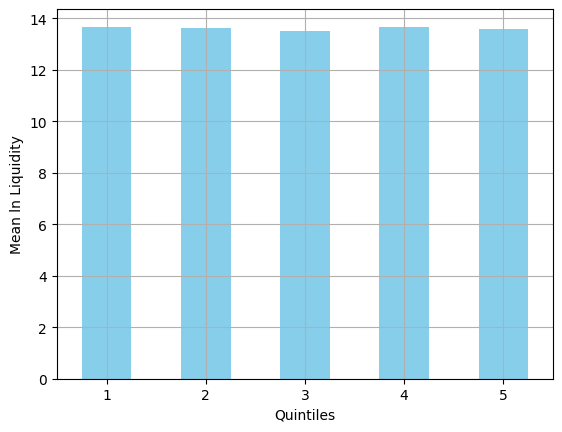

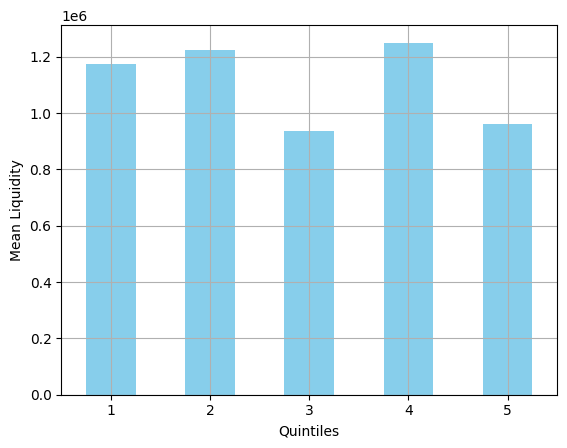

In [ ]:
df.groupby('quintiles')['ln_liq'].mean().plot(kind='bar', color='skyblue', grid='true')
plt.xlabel('Quintiles')
plt.ylabel('Mean ln Liquidity')
plt.xticks(range(5), range(1, 6), rotation=0)
plt.show()

######
df.groupby('quintiles')['LIQUIDITY'].mean().plot(kind='bar', color='skyblue', grid='true')
plt.xlabel('Quintiles')
plt.ylabel('Mean Liquidity')
plt.xticks(range(5), range(1, 6), rotation=0)
plt.show()

# 🅾 quintile Overall score

##comparing Q1 and 5 Over Time

In [ ]:
mean_returns = df.groupby(['quintiles', 'year'])['RETURN'].mean().unstack(level=0)
mean_returns

quintiles,1,2,3,4,5
year,,,,,
2015,-0.081053,0.060000,-0.140000,-0.148000,-0.057500
2016,0.098750,0.376667,0.190000,0.292000,0.194286
2017,0.141818,0.102222,0.182000,0.218750,0.297143
2018,-0.221111,-0.151111,-0.140000,0.027500,-0.097273
2019,0.003333,0.123333,0.009167,0.038750,0.074615
2020,0.097000,-0.092000,-0.051429,-0.186667,-0.130000
2021,0.466154,0.205000,0.123043,0.224615,0.130000
2022,-0.065000,-0.029583,0.122353,-0.083043,0.013333


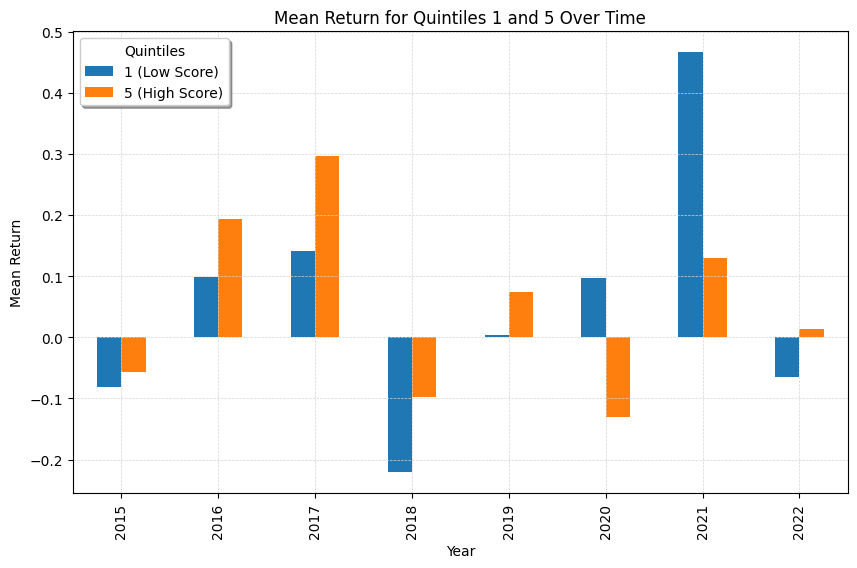

In [ ]:
import matplotlib.pyplot as plt

df['quintiles'] = pd.qcut(df['esg_OVERALL'], 5, labels=range(1, 6))
mean_returns = df.groupby(['quintiles', 'year'])['RETURN'].mean().unstack(level=0)

# Plotting only quintiles 1 and 5
mean_returns[[1, 5]].plot(kind='bar', figsize=(10, 6))

plt.grid(True, linestyle='--', linewidth=0.5, color='lightgray')
plt.xlabel('Year')
plt.ylabel('Mean Return')
plt.title('Mean Return for Quintiles 1 and 5 Over Time')
plt.legend( ['1 (Low Score)', '5 (High Score)'], title='Quintiles', loc='upper left', bbox_to_anchor=(0, 1),
          ncol=1, fancybox=True, shadow=True)

plt.show()


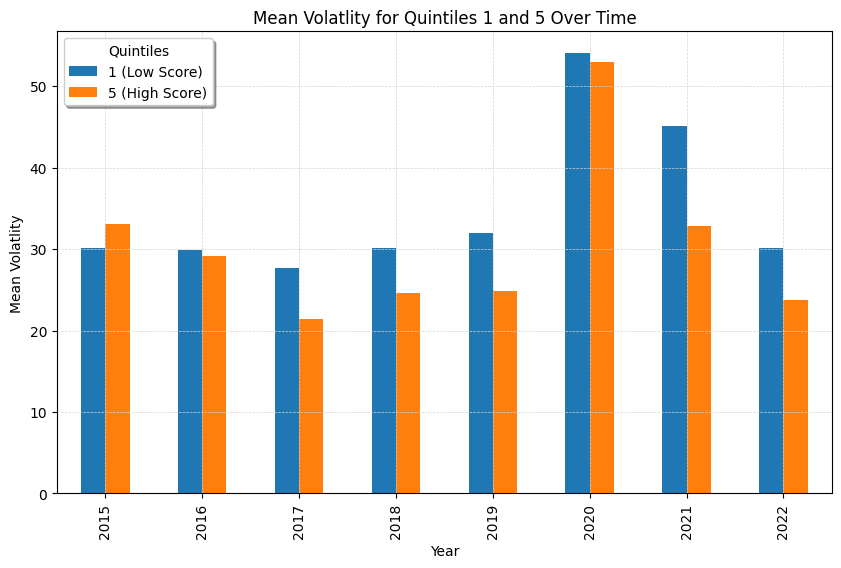

In [ ]:
# Plotting only quintiles 1 and 5
mean_vol = df.groupby(['quintiles', 'year'])['VOLATILITY_260D_CALC'].mean().unstack(level=0)
mean_vol[[1, 5]].plot(kind='bar', figsize=(10, 6))

plt.grid(True, linestyle='--', linewidth=0.5, color='lightgray')
plt.xlabel('Year')
plt.ylabel('Mean Volatlity')
plt.title('Mean Volatlity for Quintiles 1 and 5 Over Time')
plt.legend( ['1 (Low Score)', '5 (High Score)'], title='Quintiles', loc='upper left', bbox_to_anchor=(0, 1),
          ncol=1, fancybox=True, shadow=True)

plt.show()


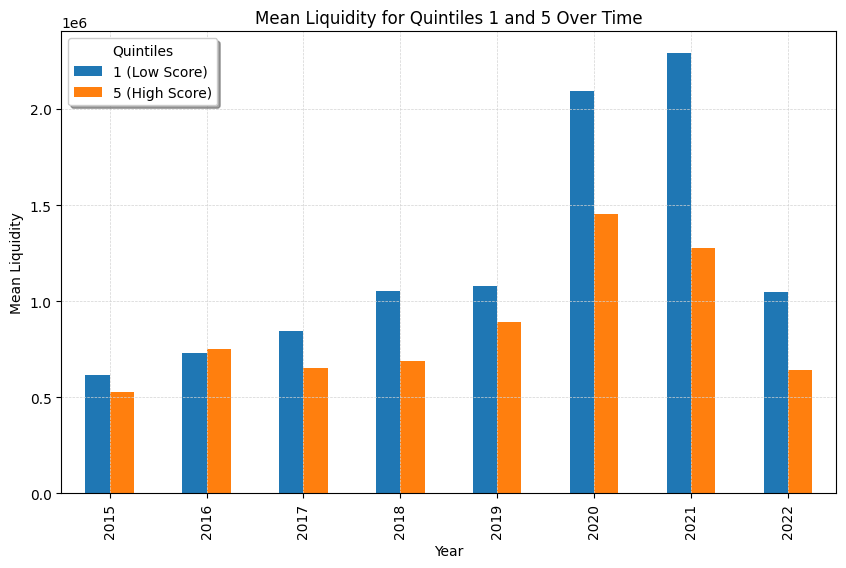

In [ ]:
# Plotting only quintiles 1 and 5
mean_liq = df.groupby(['quintiles', 'year'])['LIQUIDITY'].mean().unstack(level=0)
mean_liq[[1, 5]].plot(kind='bar', figsize=(10, 6))

plt.grid(True, linestyle='--', linewidth=0.5, color='lightgray')
plt.xlabel('Year')
plt.ylabel('Mean Liquidity')
plt.title('Mean Liquidity for Quintiles 1 and 5 Over Time')
plt.legend( ['1 (Low Score)', '5 (High Score)'], title='Quintiles', loc='upper left', bbox_to_anchor=(0, 1),
          ncol=1, fancybox=True, shadow=True)

plt.show()


##sector

In [ ]:
df.groupby(['quintiles', 'sector'])['RETURN'].mean().unstack(level=0)

quintiles,1,2,3,4,5
sector,,,,,
Communication Services,-0.121429,-0.025000,-0.122000,0.032500,NaN
Consumer Discretionary,0.216667,0.030000,0.339000,0.190000,-0.035556
Consumer Staples,0.048571,0.058182,0.017857,0.011667,-0.053333
Energy,NaN,0.265000,-0.280000,0.051250,-0.012800
Financials,0.028276,0.068750,-0.015600,0.110000,0.085000
Health Care,0.066667,0.208333,0.300000,-0.133333,0.410000
Industrials,0.230000,0.077143,-0.093333,0.008571,0.149231
Information Technology,0.444286,-0.007500,NaN,NaN,NaN
Materials,NaN,-0.020000,-0.008000,0.145000,0.001538


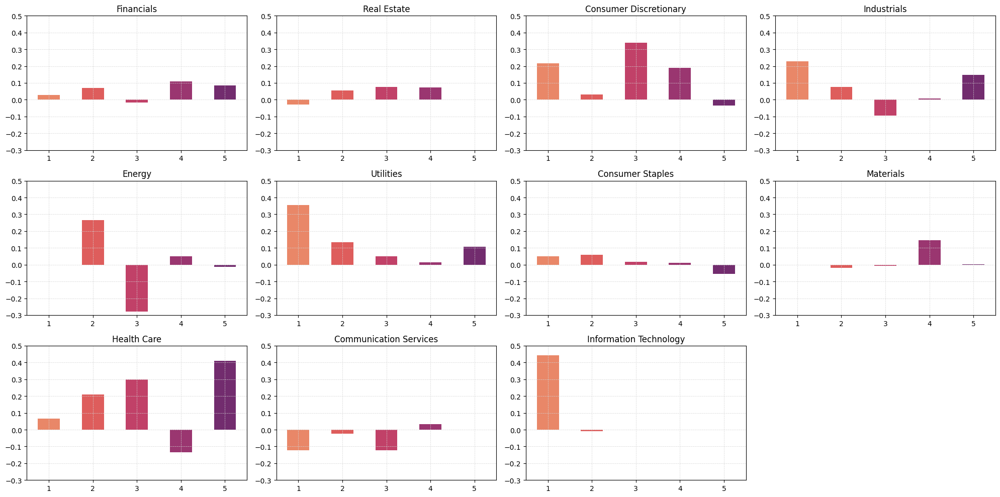

In [ ]:
import seaborn as sns

palette = sns.color_palette("flare", df['quintiles'].nunique())

fig, axs = plt.subplots(3, 4, figsize=(20, 10))
axs = axs.flatten()
axs[11].axis('off')

# Iterate through sectors and plot bar plots
for i, sector in enumerate(sectors):
    # Group data by 'quintiles' and calculate the mean of 'RETURN'
    sector_data = df[df['sector'] == sector].groupby('quintiles')['RETURN'].mean()
    # Plot bar plot for each sector on the corresponding subplot
    sector_data.plot(kind='bar', ax=axs[i], color=palette, grid=True)
    axs[i].set_title(sector)
    axs[i].set_xlabel('')
    axs[i].xaxis.grid(True)
    axs[i].set_xticklabels(range(1,6), rotation=0)
    axs[i].set_ylim(-0.3, 0.5)  # Set common y-axis limits
    axs[i].grid(True, linestyle='--', linewidth=0.5, color='lightgray')

plt.tight_layout()  # Adjust layout for better spacing
plt.show()

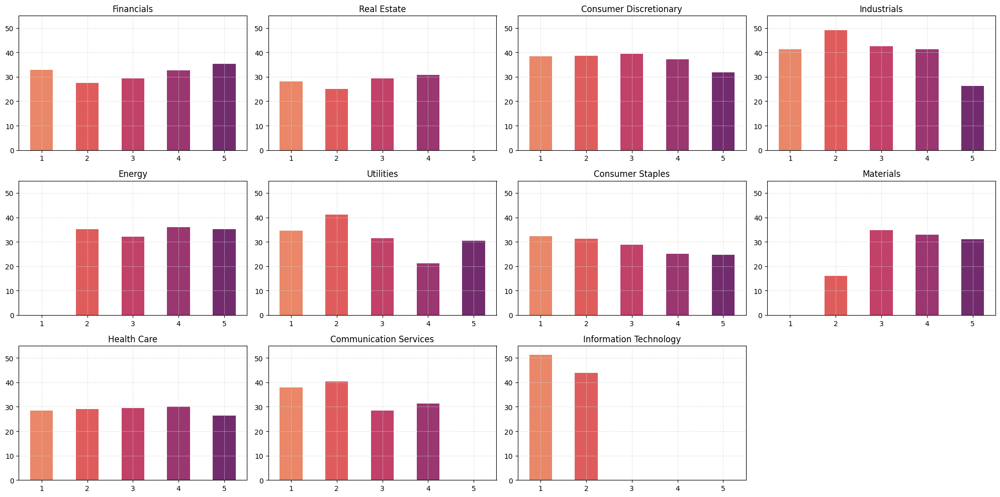

In [ ]:
import seaborn as sns

palette = sns.color_palette("flare", df['quintiles'].nunique())

fig, axs = plt.subplots(3, 4, figsize=(20, 10))
axs = axs.flatten()  # Flatten the axs array since you have 3x4 subplots

axs[11].axis('off')

# Iterate through sectors and plot bar plots
for i, sector in enumerate(sectors):
    # Group data by 'quintiles' and calculate the mean of 'Volatility'
    sector_data = df[df['sector'] == sector].groupby('quintiles')['VOLATILITY_260D_CALC'].mean()
    # Plot bar plot for each sector on the corresponding subplot
    sector_data.plot(kind='bar', ax=axs[i], color=palette, grid=True)
    axs[i].set_title(sector)
    axs[i].set_xlabel('')
    axs[i].xaxis.grid(True)
    axs[i].set_xticklabels(range(1,6), rotation=0)
    axs[i].set_ylim(0, 55)  # Set common y-axis limits
    axs[i].grid(True, linestyle='--', linewidth=0.5, color='lightgray')

plt.tight_layout()  # Adjust layout for better spacing
plt.show()


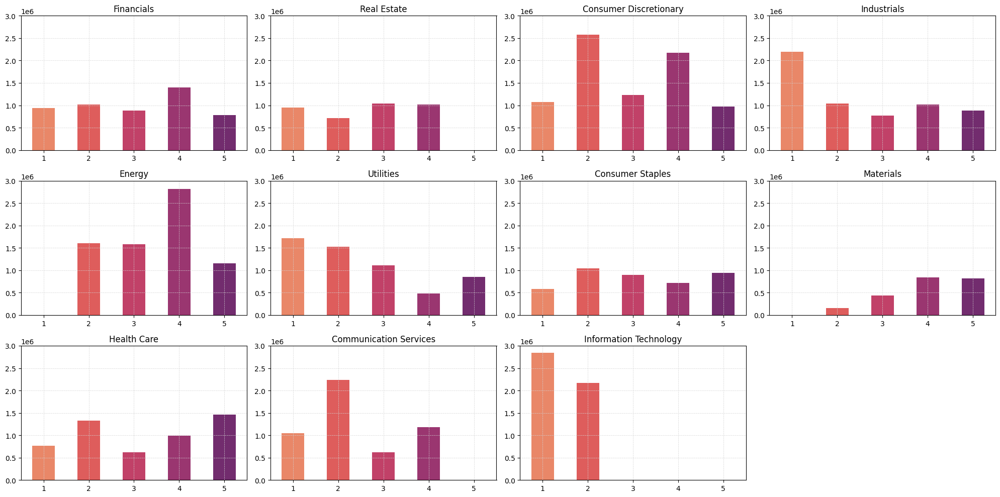

In [ ]:
import seaborn as sns

palette = sns.color_palette("flare", df['quintiles'].nunique())

fig, axs = plt.subplots(3, 4, figsize=(20, 10))
axs = axs.flatten()  # Flatten the axs array since you have 3x4 subplots

axs[11].axis('off')

# Iterate through sectors and plot bar plots
for i, sector in enumerate(sectors):
    # Group data by 'quintiles' and calculate the mean of 'Liquidity'
    sector_data = df[df['sector'] == sector].groupby('quintiles')['LIQUIDITY'].mean()
    # Plot bar plot for each sector on the corresponding subplot
    sector_data.plot(kind='bar', ax=axs[i], color=palette, grid=True)
    axs[i].set_title(sector)
    axs[i].set_xlabel('')
    axs[i].xaxis.grid(True)
    axs[i].set_xticklabels(range(1,6), rotation=0)
    axs[i].set_ylim(0, 3000000)  # Set common y-axis limits
    axs[i].grid(True, linestyle='--', linewidth=0.5, color='lightgray')

plt.tight_layout()  # Adjust layout for better spacing
plt.show()


## Pre, covid, Post covid

In [ ]:
df[(df['year'] <= 2019)].groupby(['quintiles', 'year'])['RETURN'].mean().unstack(level=0)

quintiles,1,2,3,4,5
year,,,,,
2015,-0.081053,0.060000,-0.140000,-0.14800,-0.057500
2016,0.098750,0.376667,0.190000,0.29200,0.194286
2017,0.141818,0.102222,0.182000,0.21875,0.297143
2018,-0.221111,-0.151111,-0.140000,0.02750,-0.097273
2019,0.003333,0.123333,0.009167,0.03875,0.074615


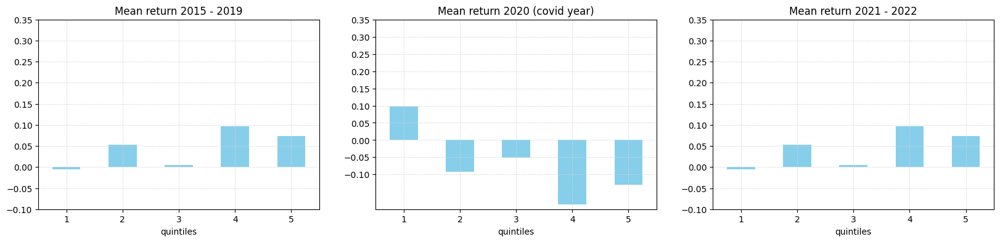

In [ ]:
import matplotlib.pyplot as plt

fig, axs = plt.subplots(1, 3, figsize=(20, 4))

# Group by quintiles and calculate mean for each subgroup
data_2019 = df[df['year'] <= 2019].groupby(['quintiles'])['RETURN'].mean()
data_2020_2021 = df[(df['year'] == 2020) & (df['year'] <= 2021)].groupby(['quintiles'])['RETURN'].mean()
data_2022 = df[df['year'] < 2020].groupby(['quintiles'])['RETURN'].mean()

# Plotting the data for each year in separate subplots
data_2019.plot(kind='bar', color='skyblue', grid='true', ax=axs[0])
data_2020_2021.plot(kind='bar', color='skyblue', grid='true', ax=axs[1])
data_2022.plot(kind='bar', color='skyblue', grid='true', ax=axs[2])

axs[0].set_title('Mean return 2015 - 2019')
axs[1].set_title('Mean return 2020 (covid year)')
axs[2].set_title('Mean return 2021 - 2022')

# Set common x and y ticks for all subplots
for ax in axs:
    ax.set_yticks(np.arange(-0.1, 0.4, 0.05))
    ax.set_xticklabels(range(1,6), rotation=0)
    ax.grid(True, linestyle='--', linewidth=0.5, color='lightgray')

plt.show()

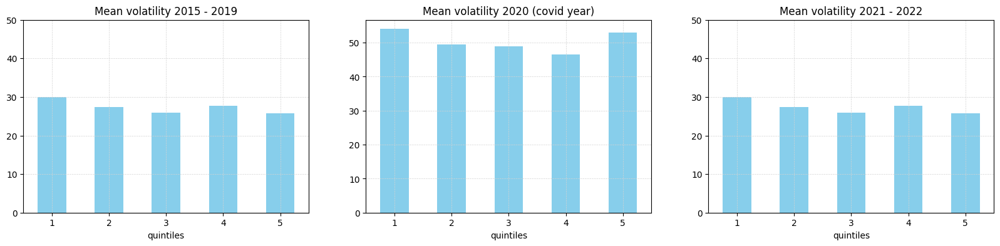

In [ ]:
import matplotlib.pyplot as plt

fig, axs = plt.subplots(1, 3, figsize=(20, 4))

# Group by quintiles and calculate mean for each subgroup
data_2019 = df[df['year'] <= 2019].groupby(['quintiles'])['VOLATILITY_260D_CALC'].mean()
data_2020_2021 = df[(df['year'] == 2020)].groupby(['quintiles'])['VOLATILITY_260D_CALC'].mean()
data_2022 = df[df['year'] < 2020].groupby(['quintiles'])['VOLATILITY_260D_CALC'].mean()

# Plotting the data for each year in separate subplots
data_2019.plot(kind='bar', color='skyblue', grid='true', ax=axs[0])
data_2020_2021.plot(kind='bar', color='skyblue', grid='true', ax=axs[1])
data_2022.plot(kind='bar', color='skyblue', grid='true', ax=axs[2])

axs[0].set_title('Mean volatility 2015 - 2019')
axs[1].set_title('Mean volatility 2020 (covid year)')
axs[2].set_title('Mean volatility 2021 - 2022')

# Set common x and y ticks for all subplots
for ax in axs:
    ax.set_yticks(np.arange(0, 60, 10))
    ax.set_xticklabels(range(1,6), rotation=0)
    ax.grid(True, linestyle='--', linewidth=0.5, color='lightgray')

plt.show()

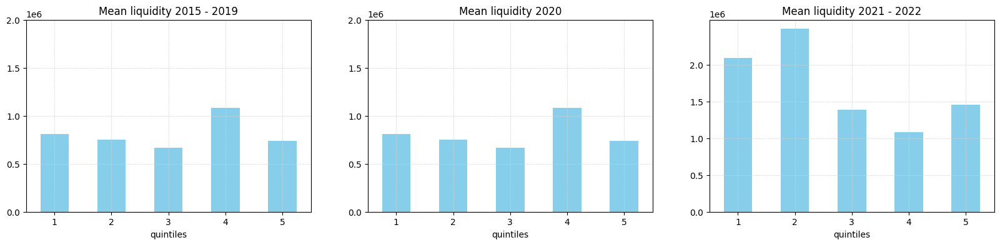

In [ ]:
import matplotlib.pyplot as plt

fig, axs = plt.subplots(1, 3, figsize=(20, 4))

# Group by quintiles and calculate mean for each subgroup
data_2019 = df[df['year'] <= 2019].groupby(['quintiles'])['LIQUIDITY'].mean()
data_2022 = df[df['year'] == 2020].groupby(['quintiles'])['LIQUIDITY'].mean()
data_2020_2021 = df[(df['year'] < 2020)].groupby(['quintiles'])['LIQUIDITY'].mean()

# Plotting the data for each year in separate subplots
data_2019.plot(kind='bar', color='skyblue', grid='true', ax=axs[0])
data_2020_2021.plot(kind='bar', color='skyblue', grid='true', ax=axs[1])
data_2022.plot(kind='bar', color='skyblue', grid='true', ax=axs[2])

axs[0].set_title('Mean liquidity 2015 - 2019')
axs[1].set_title('Mean liquidity 2020')
axs[2].set_title('Mean liquidity 2021 - 2022')

# Set common x and y ticks for all subplots
for ax in axs:
    ax.set_yticks(np.arange(0, 2500000, 500000))
    ax.set_xticklabels(range(1,6), rotation=0)
    ax.grid(True, linestyle='--', linewidth=0.5, color='lightgray')

plt.show()

## Pre, covid, Post covid & sector


In [ ]:
sectors

['Financials',
 'Real Estate',
 'Consumer Discretionary',
 'Industrials',
 'Energy',
 'Utilities',
 'Consumer Staples',
 'Materials',
 'Health Care',
 'Communication Services',
 'Information Technology']

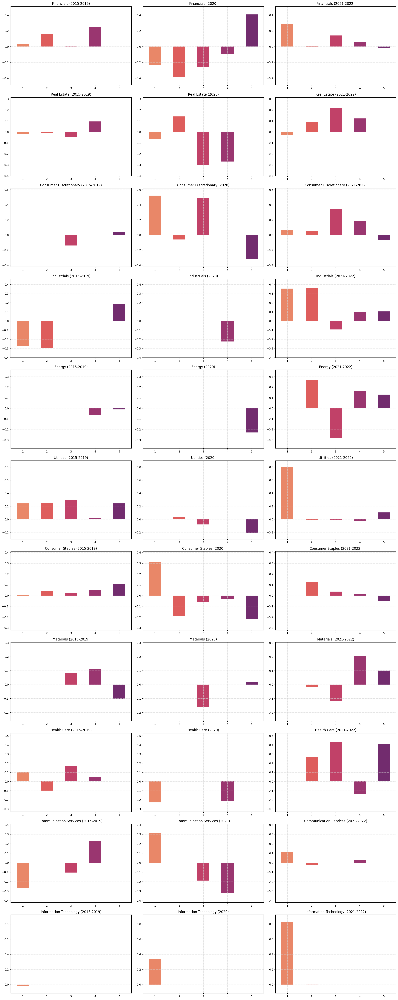

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

fig, axs = plt.subplots(11, 3, figsize=(20, 50))
axs = axs.flatten()     # Flatten the axs array since you have 3x11 subplots

palette = sns.color_palette("flare", df['quintiles'].nunique())

i = 0

for sector in sectors:
    sector_2019 = df[(df['sector'] == sector) & (df['year'] <= 2019)].groupby(['quintiles'])['RETURN'].mean()
    sector_2020 = df[(df['sector'] == sector) & (df['year'] == 2020) & (df['year'] <= 2021)].groupby(['quintiles'])['RETURN'].mean()
    sector_2021 = df[(df['sector'] == sector) & (df['year'] > 2020)].groupby(['quintiles'])['RETURN'].mean()
    sector_2019.plot(kind='bar', ax=axs[i], color=palette, grid=True)
    axs[i].set_title(sector + ' (2015-2019)')
    sector_2020.plot(kind='bar', ax=axs[i+1], color=palette, grid=True)
    axs[i+1].set_title(sector + ' (2020)')
    sector_2021.plot(kind='bar', ax=axs[i+2], color=palette, grid=True)
    axs[i+2].set_title(sector + ' (2021-2022)')

    min_return = min(sector_2019.min(), sector_2020.min(), sector_2021.min())
    max_return = max(sector_2019.max(), sector_2020.max(), sector_2021.max())

    for ax in [axs[i], axs[i+1], axs[i+2]]:
        ax.set_xlabel('')
        ax.set_ylim(min_return -0.1 , max_return +0.1)  # Set common y-axis limits
        ax.set_xticklabels(range(1,6), rotation=0)
        ax.grid(True, linestyle='--', linewidth=0.5, color='lightgray')

    i += 3

plt.tight_layout()  # Adjust layout for better spacing
plt.show()


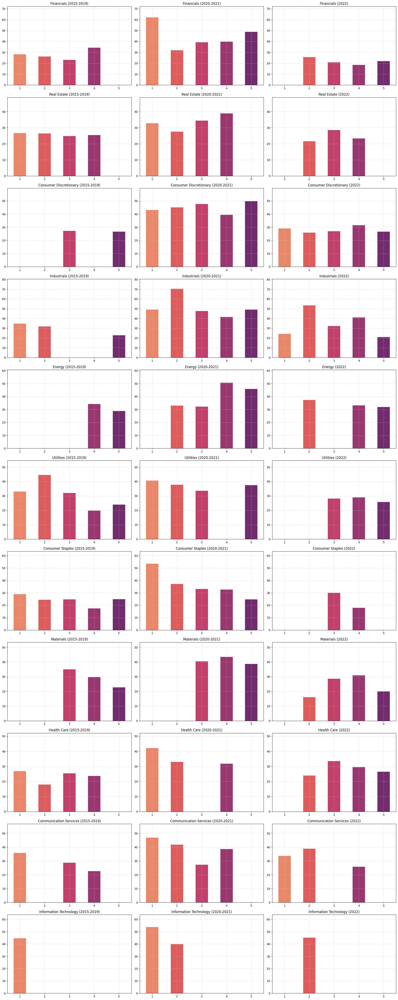

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

fig, axs = plt.subplots(11, 3, figsize=(20, 50))
axs = axs.flatten()     # Flatten the axs array since you have 3x11 subplots

palette = sns.color_palette("flare", df['quintiles'].nunique())

i = 0

for sector in sectors:
    sector_2019 = df[(df['sector'] == sector) & (df['year'] <= 2019)].groupby(['quintiles'])['VOLATILITY_260D_CALC'].mean()
    sector_2020 = df[(df['sector'] == sector) & (df['year'] > 2019) & (df['year'] <= 2021)].groupby(['quintiles'])['VOLATILITY_260D_CALC'].mean()
    sector_2021 = df[(df['sector'] == sector) & (df['year'] == 2022)].groupby(['quintiles'])['VOLATILITY_260D_CALC'].mean()
    sector_2019.plot(kind='bar', ax=axs[i], color=palette, grid=True)
    axs[i].set_title(sector + ' (2015-2019)')
    sector_2020.plot(kind='bar', ax=axs[i+1], color=palette, grid=True)
    axs[i+1].set_title(sector + ' (2020-2021)')
    sector_2021.plot(kind='bar', ax=axs[i+2], color=palette, grid=True)
    axs[i+2].set_title(sector + ' (2022)')


    max_vol = max(sector_2019.max(), sector_2020.max(), sector_2021.max())

    for ax in [axs[i], axs[i+1], axs[i+2]]:
        ax.set_xlabel('')
        ax.set_ylim(0 , max_vol +10)  # Set common y-axis limits
        ax.set_xticklabels(range(1,6), rotation=0)
        ax.grid(True, linestyle='--', linewidth=0.5, color='lightgray')

    i += 3

plt.tight_layout()  # Adjust layout for better spacing
plt.show()


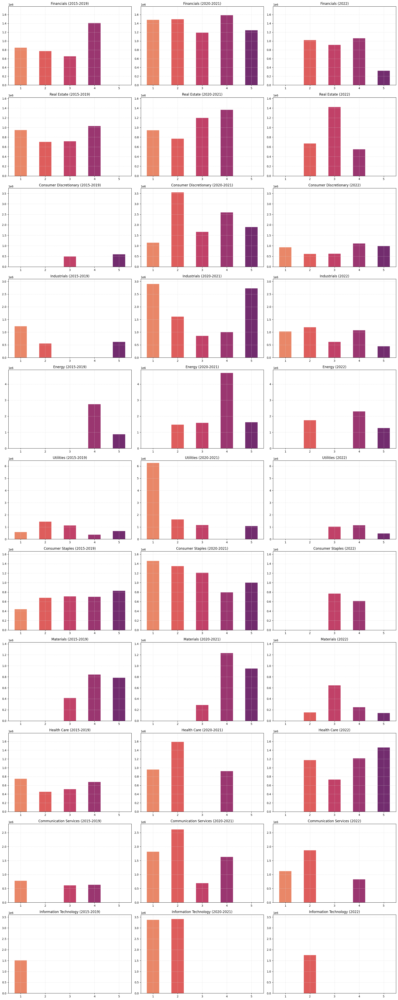

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

fig, axs = plt.subplots(11, 3, figsize=(20, 50))
axs = axs.flatten()     # Flatten the axs array since you have 3x11 subplots

palette = sns.color_palette("flare", df['quintiles'].nunique())

i = 0

for sector in sectors:
    sector_2019 = df[(df['sector'] == sector) & (df['year'] <= 2019)].groupby(['quintiles'])['LIQUIDITY'].mean()
    sector_2020 = df[(df['sector'] == sector) & (df['year'] > 2019) & (df['year'] <= 2021)].groupby(['quintiles'])['LIQUIDITY'].mean()
    sector_2021 = df[(df['sector'] == sector) & (df['year'] == 2022)].groupby(['quintiles'])['LIQUIDITY'].mean()
    sector_2019.plot(kind='bar', ax=axs[i], color=palette, grid=True)
    axs[i].set_title(sector + ' (2015-2019)')
    sector_2020.plot(kind='bar', ax=axs[i+1], color=palette, grid=True)
    axs[i+1].set_title(sector + ' (2020-2021)')
    sector_2021.plot(kind='bar', ax=axs[i+2], color=palette, grid=True)
    axs[i+2].set_title(sector + ' (2022)')


    min_liq = min(sector_2019.min(), sector_2020.min(), sector_2021.min())
    max_liq = max(sector_2019.max(), sector_2020.max(), sector_2021.max())

    for ax in [axs[i], axs[i+1], axs[i+2]]:
        ax.set_xlabel('')
        ax.set_ylim(0 , max_liq +200000)  # Set common y-axis limits
        ax.set_xticklabels(range(1,6), rotation=0)
        ax.grid(True, linestyle='--', linewidth=0.5, color='lightgray')

    i += 3

plt.tight_layout()  # Adjust layout for better spacing
plt.show()


###

# 🅴 quintile Environmental score

##comparing Q1 and 5 Over Time

In [ ]:
df['quintiles_e'] = pd.qcut(df['esg_E'], 5 , labels=(range(1,6)))
df[['quintiles_e', 'esg_E', 'RETURN']]

,quintiles_e,esg_E,RETURN
0,3,1.77,0.19
1,4,3.04,0.12
2,3,2.16,-0.26
3,3,2.16,-0.04
4,3,1.90,0.26
...,...,...,...
439,4,3.92,0.01
440,3,1.39,-0.08
441,3,1.39,-0.01
442,4,2.70,-0.36


In [ ]:
mean_returns_e = df.groupby(['quintiles_e', 'year'])['RETURN'].mean().unstack(level=0)
mean_returns_e

quintiles_e,1,2,3,4,5
year,,,,,
2015,-2.705882e-02,-0.126000,-0.305000,-0.137143,-0.057500
2016,7.785714e-02,0.300000,0.180000,0.268750,0.201667
2017,1.866667e-01,0.201667,0.075000,0.171250,0.300000
2018,-1.890909e-01,-0.158750,-0.214286,-0.060000,-0.046667
2019,9.375000e-02,0.066667,-0.166667,0.142500,0.033571
2020,4.545455e-03,-0.070833,0.004000,-0.020000,-0.173125
2021,2.866667e-01,0.194375,0.182143,0.229259,0.169000
2022,-3.083953e-18,-0.029333,0.010741,-0.010556,-0.027273


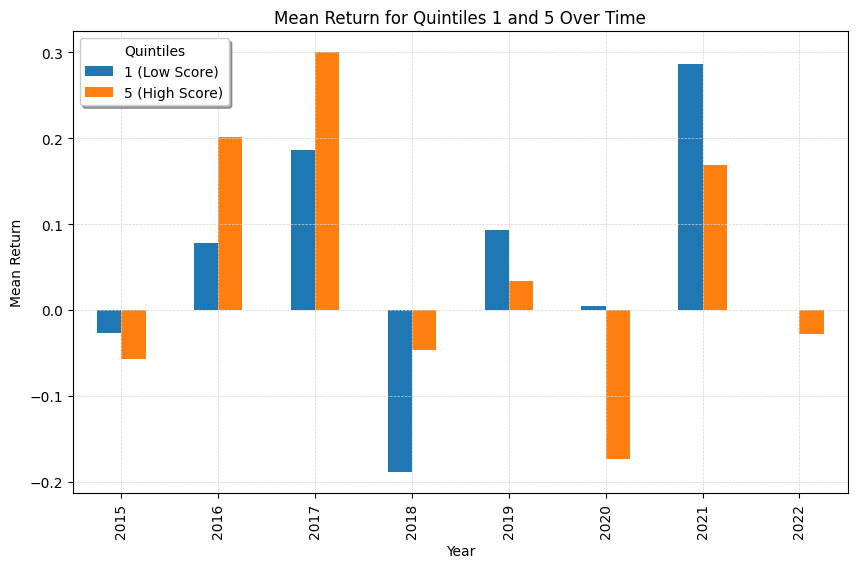

In [ ]:
import matplotlib.pyplot as plt

mean_returns_e = df.groupby(['quintiles_e', 'year'])['RETURN'].mean().unstack(level=0)

# Plotting only quintiles 1 and 5
mean_returns_e[[1, 5]].plot(kind='bar', figsize=(10, 6))

plt.grid(True, linestyle='--', linewidth=0.5, color='lightgray')
plt.xlabel('Year')
plt.ylabel('Mean Return')
plt.title('Mean Return for Quintiles 1 and 5 Over Time')
plt.legend( ['1 (Low Score)', '5 (High Score)'], title='Quintiles', loc='upper left', bbox_to_anchor=(0, 1),
          ncol=1, fancybox=True, shadow=True)

plt.show()


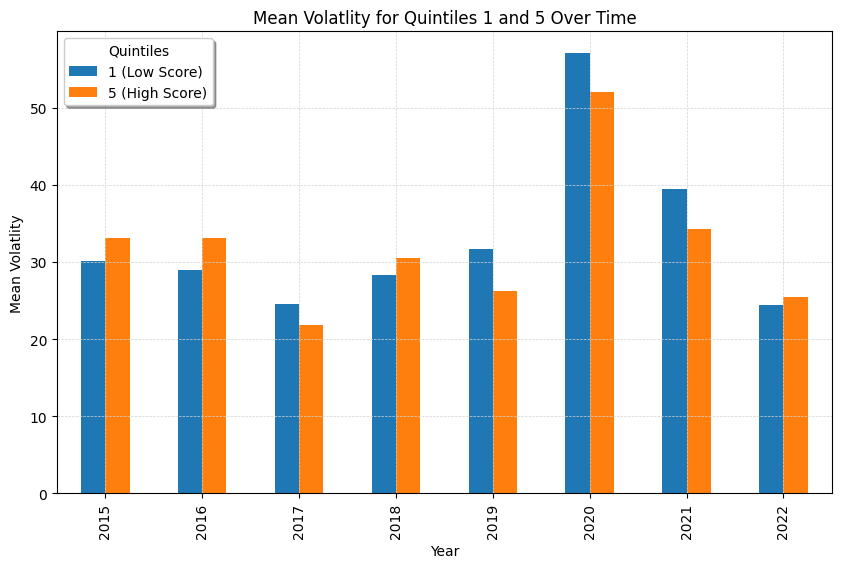

In [ ]:
# Plotting only quintiles 1 and 5
mean_vol_e = df.groupby(['quintiles_e', 'year'])['VOLATILITY_260D_CALC'].mean().unstack(level=0)
mean_vol_e[[1, 5]].plot(kind='bar', figsize=(10, 6))

plt.grid(True, linestyle='--', linewidth=0.5, color='lightgray')
plt.xlabel('Year')
plt.ylabel('Mean Volatlity')
plt.title('Mean Volatlity for Quintiles 1 and 5 Over Time')
plt.legend( ['1 (Low Score)', '5 (High Score)'], title='Quintiles', loc='upper left', bbox_to_anchor=(0, 1),
          ncol=1, fancybox=True, shadow=True)

plt.show()


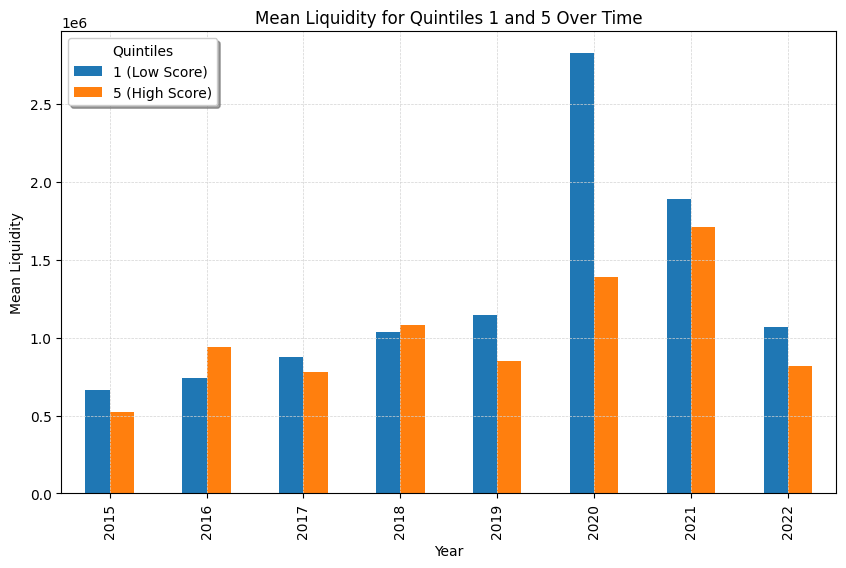

In [ ]:
# Plotting only quintiles 1 and 5
mean_liq_e = df.groupby(['quintiles_e', 'year'])['LIQUIDITY'].mean().unstack(level=0)
mean_liq_e[[1, 5]].plot(kind='bar', figsize=(10, 6))

plt.grid(True, linestyle='--', linewidth=0.5, color='lightgray')
plt.xlabel('Year')
plt.ylabel('Mean Liquidity')
plt.title('Mean Liquidity for Quintiles 1 and 5 Over Time')
plt.legend( ['1 (Low Score)', '5 (High Score)'], title='Quintiles', loc='upper left', bbox_to_anchor=(0, 1),
          ncol=1, fancybox=True, shadow=True)

plt.show()


##sector

In [ ]:
df.groupby(['quintiles_e', 'sector'])['RETURN'].mean().unstack(level=0)

quintiles_e,1,2,3,4,5
sector,,,,,
Communication Services,-0.105385,-0.050000,-0.039000,-0.086667,-0.010000
Consumer Discretionary,0.184000,0.131429,0.217778,0.353333,0.033636
Consumer Staples,NaN,0.048571,0.060000,0.015625,-0.028333
Energy,NaN,NaN,0.102000,0.100000,-0.025769
Financials,0.051970,-0.102500,NaN,0.130833,0.490000
Health Care,0.175000,-0.105000,-0.095714,0.120000,0.130000
Industrials,0.556667,0.028571,-0.010000,0.082500,0.091429
Information Technology,0.288000,NaN,0.055000,0.382500,NaN
Materials,NaN,NaN,-0.070000,0.087222,0.043077


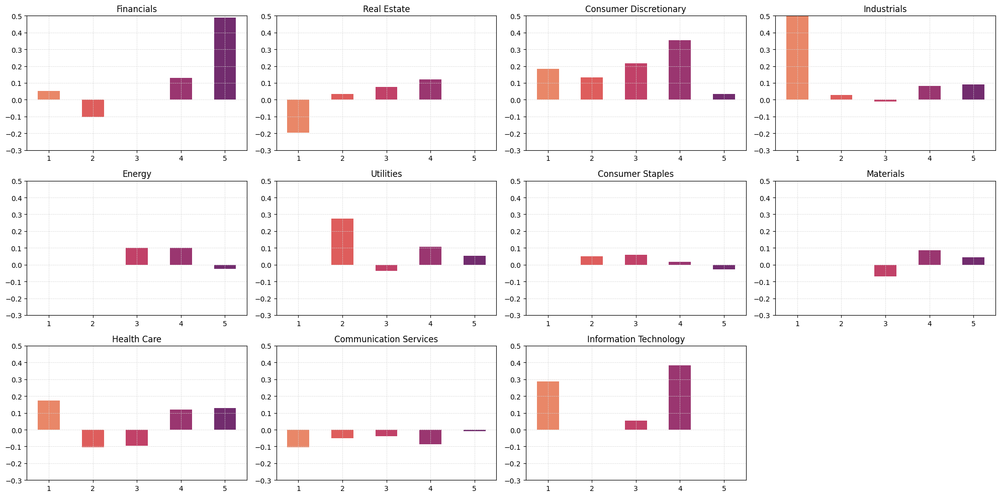

In [ ]:
import seaborn as sns

palette = sns.color_palette("flare", df['quintiles_e'].nunique())

fig, axs = plt.subplots(3, 4, figsize=(20, 10))
axs = axs.flatten()
axs[11].axis('off')

# Iterate through sectors and plot bar plots
for i, sector in enumerate(sectors):
    # Group data by 'quintiles' and calculate the mean of 'RETURN'
    sector_data = df[df['sector'] == sector].groupby('quintiles_e')['RETURN'].mean()
    # Plot bar plot for each sector on the corresponding subplot
    sector_data.plot(kind='bar', ax=axs[i], color=palette, grid=True)
    axs[i].set_title(sector)
    axs[i].set_xlabel('')
    axs[i].xaxis.grid(True)
    axs[i].set_xticklabels(range(1,6), rotation=0)
    axs[i].set_ylim(-0.3, 0.5)  # Set common y-axis limits
    axs[i].grid(True, linestyle='--', linewidth=0.5, color='lightgray')

plt.tight_layout()  # Adjust layout for better spacing
plt.show()


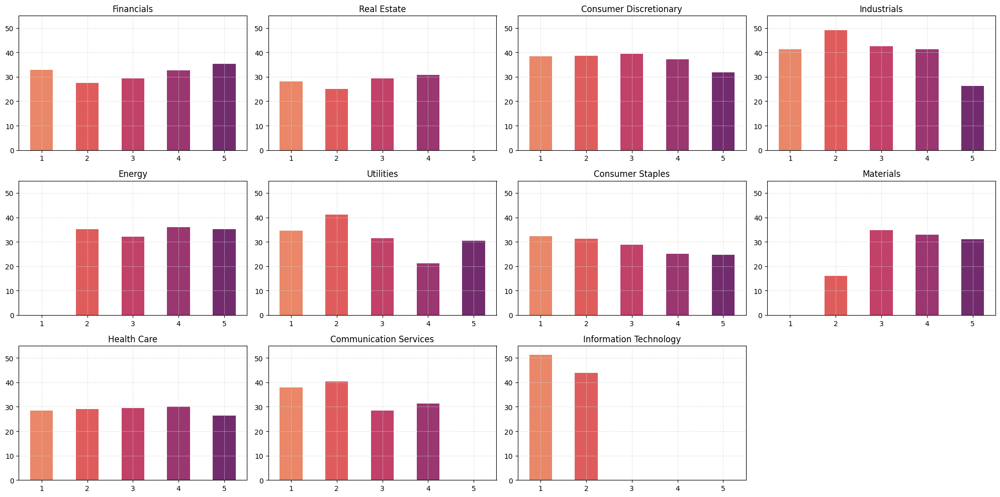

In [ ]:
import seaborn as sns

palette = sns.color_palette("flare", df['quintiles_e'].nunique())

fig, axs = plt.subplots(3, 4, figsize=(20, 10))
axs = axs.flatten()
axs[11].axis('off')

# Iterate through sectors and plot bar plots
for i, sector in enumerate(sectors):
    # Group data by 'quintiles' and calculate the mean of 'Volatility'
    sector_data = df[df['sector'] == sector].groupby('quintiles')['VOLATILITY_260D_CALC'].mean()
    # Plot bar plot for each sector on the corresponding subplot
    sector_data.plot(kind='bar', ax=axs[i], color=palette, grid=True)
    axs[i].set_title(sector)
    axs[i].set_xlabel('')
    axs[i].xaxis.grid(True)
    axs[i].set_xticklabels(range(1,6), rotation=0)
    axs[i].set_ylim(0, 55)  # Set common y-axis limits
    axs[i].grid(True, linestyle='--', linewidth=0.5, color='lightgray')

plt.tight_layout()  # Adjust layout for better spacing
plt.show()


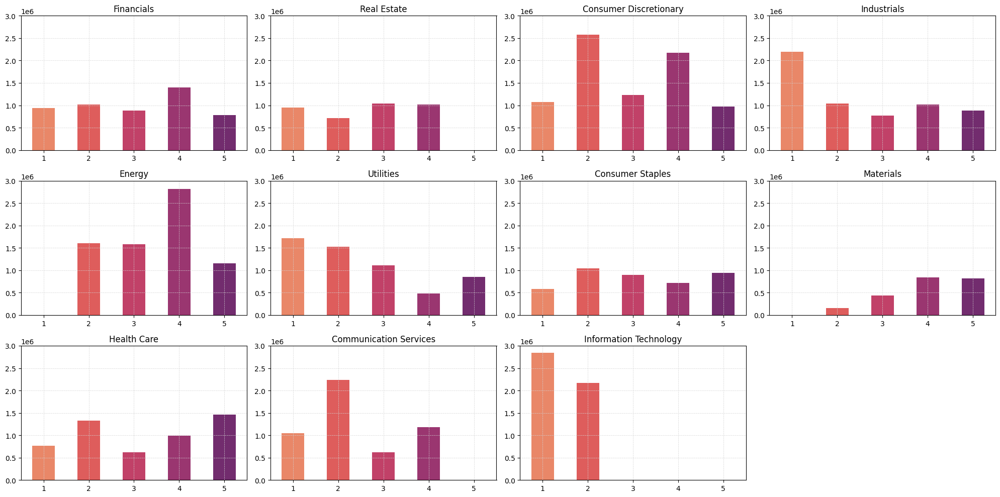

In [ ]:
import seaborn as sns

palette = sns.color_palette("flare", df['quintiles_e'].nunique())

fig, axs = plt.subplots(3, 4, figsize=(20, 10))
axs = axs.flatten()  # Flatten the axs array since you have 3x4 subplots

axs[11].axis('off')

# Iterate through sectors and plot bar plots
for i, sector in enumerate(sectors):
    # Group data by 'quintiles' and calculate the mean of 'Liquidity'
    sector_data = df[df['sector'] == sector].groupby('quintiles')['LIQUIDITY'].mean()
    # Plot bar plot for each sector on the corresponding subplot
    sector_data.plot(kind='bar', ax=axs[i], color=palette, grid=True)
    axs[i].set_title(sector)
    axs[i].set_xlabel('')
    axs[i].xaxis.grid(True)
    axs[i].set_xticklabels(range(1,6), rotation=0)
    axs[i].set_ylim(0, 3000000)  # Set common y-axis limits
    axs[i].grid(True, linestyle='--', linewidth=0.5, color='lightgray')

plt.tight_layout()  # Adjust layout for better spacing
plt.show()


## Pre, covid, Post covid

In [ ]:
df[(df['year'] <= 2019)].groupby(['quintiles_e', 'year'])['RETURN'].mean().unstack(level=0)

quintiles_e,1,2,3,4,5
year,,,,,
2015,-0.027059,-0.126000,-0.305000,-0.137143,-0.057500
2016,0.077857,0.300000,0.180000,0.268750,0.201667
2017,0.186667,0.201667,0.075000,0.171250,0.300000
2018,-0.189091,-0.158750,-0.214286,-0.060000,-0.046667
2019,0.093750,0.066667,-0.166667,0.142500,0.033571


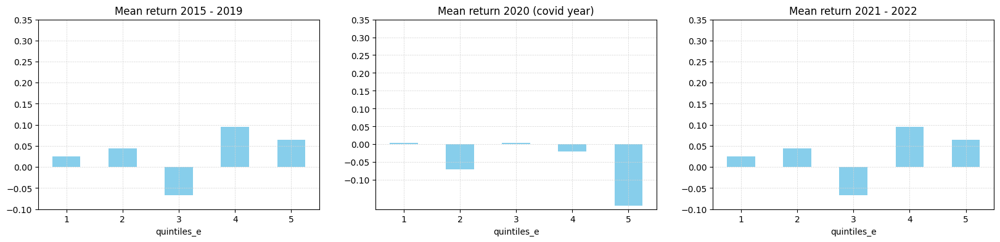

In [ ]:
import matplotlib.pyplot as plt

fig, axs = plt.subplots(1, 3, figsize=(20, 4))

# Group by quintiles and calculate mean for each subgroup
data_2019 = df[df['year'] <= 2019].groupby(['quintiles_e'])['RETURN'].mean()
data_2020_2021 = df[(df['year'] == 2020) & (df['year'] <= 2021)].groupby(['quintiles_e'])['RETURN'].mean()
data_2022 = df[df['year'] < 2020].groupby(['quintiles_e'])['RETURN'].mean()

# Plotting the data for each year in separate subplots
data_2019.plot(kind='bar', color='skyblue', grid='true', ax=axs[0])
data_2020_2021.plot(kind='bar', color='skyblue', grid='true', ax=axs[1])
data_2022.plot(kind='bar', color='skyblue', grid='true', ax=axs[2])

axs[0].set_title('Mean return 2015 - 2019')
axs[1].set_title('Mean return 2020 (covid year)')
axs[2].set_title('Mean return 2021 - 2022')

# Set common x and y ticks for all subplots
for ax in axs:
    ax.set_yticks(np.arange(-0.1, 0.4, 0.05))
    ax.set_xticklabels(range(1,6), rotation=0)
    ax.grid(True, linestyle='--', linewidth=0.5, color='lightgray')

plt.show()

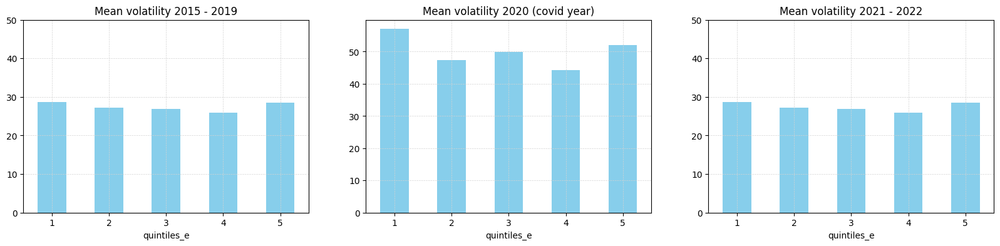

In [ ]:
import matplotlib.pyplot as plt

fig, axs = plt.subplots(1, 3, figsize=(20, 4))

# Group by quintiles and calculate mean for each subgroup
data_2019 = df[df['year'] <= 2019].groupby(['quintiles_e'])['VOLATILITY_260D_CALC'].mean()
data_2020_2021 = df[(df['year'] == 2020)].groupby(['quintiles_e'])['VOLATILITY_260D_CALC'].mean()
data_2022 = df[df['year'] < 2020].groupby(['quintiles_e'])['VOLATILITY_260D_CALC'].mean()

# Plotting the data for each year in separate subplots
data_2019.plot(kind='bar', color='skyblue', grid='true', ax=axs[0])
data_2020_2021.plot(kind='bar', color='skyblue', grid='true', ax=axs[1])
data_2022.plot(kind='bar', color='skyblue', grid='true', ax=axs[2])

axs[0].set_title('Mean volatility 2015 - 2019')
axs[1].set_title('Mean volatility 2020 (covid year)')
axs[2].set_title('Mean volatility 2021 - 2022')

# Set common x and y ticks for all subplots
for ax in axs:
    ax.set_yticks(np.arange(0, 60, 10))
    ax.set_xticklabels(range(1,6), rotation=0)
    ax.grid(True, linestyle='--', linewidth=0.5, color='lightgray')

plt.show()

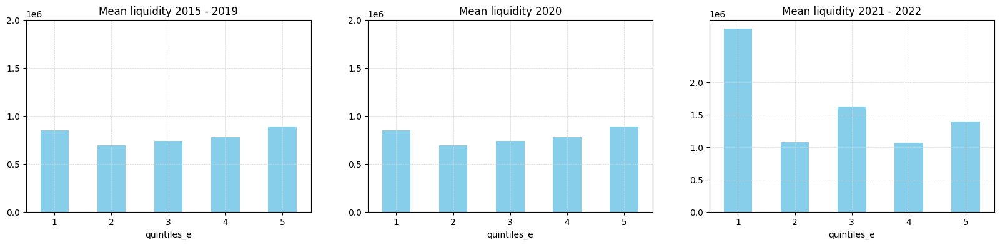

In [ ]:
import matplotlib.pyplot as plt

fig, axs = plt.subplots(1, 3, figsize=(20, 4))

# Group by quintiles and calculate mean for each subgroup
data_2019 = df[df['year'] <= 2019].groupby(['quintiles_e'])['LIQUIDITY'].mean()
data_2022 = df[df['year'] == 2020].groupby(['quintiles_e'])['LIQUIDITY'].mean()
data_2020_2021 = df[(df['year'] < 2020)].groupby(['quintiles_e'])['LIQUIDITY'].mean()

# Plotting the data for each year in separate subplots
data_2019.plot(kind='bar', color='skyblue', grid='true', ax=axs[0])
data_2020_2021.plot(kind='bar', color='skyblue', grid='true', ax=axs[1])
data_2022.plot(kind='bar', color='skyblue', grid='true', ax=axs[2])

axs[0].set_title('Mean liquidity 2015 - 2019')
axs[1].set_title('Mean liquidity 2020')
axs[2].set_title('Mean liquidity 2021 - 2022')

# Set common x and y ticks for all subplots
for ax in axs:
    ax.set_yticks(np.arange(0, 2500000, 500000))
    ax.set_xticklabels(range(1,6), rotation=0)
    ax.grid(True, linestyle='--', linewidth=0.5, color='lightgray')

plt.show()

## Pre, covid, Post covid & sector


In [ ]:
sectors

['Financials',
 'Real Estate',
 'Consumer Discretionary',
 'Industrials',
 'Energy',
 'Utilities',
 'Consumer Staples',
 'Materials',
 'Health Care',
 'Communication Services',
 'Information Technology']

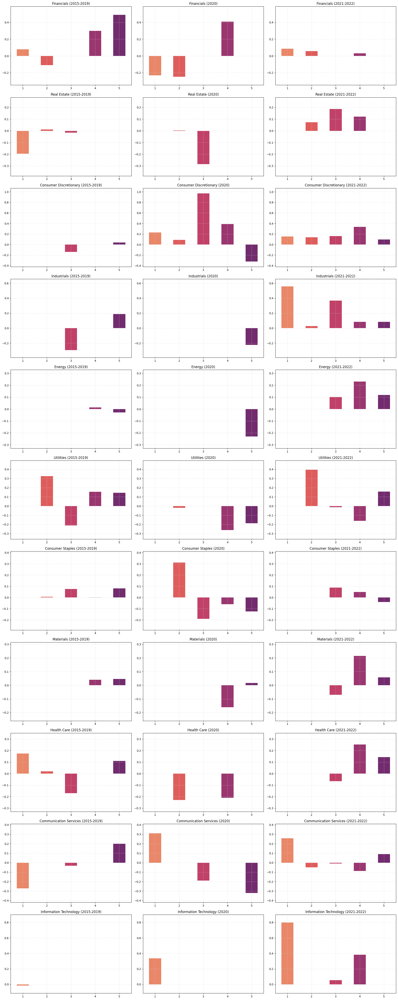

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

fig, axs = plt.subplots(11, 3, figsize=(20, 50))
axs = axs.flatten()     # Flatten the axs array since you have 3x11 subplots

palette = sns.color_palette("flare", df['quintiles_e'].nunique())

i = 0

for sector in sectors:
    sector_2019 = df[(df['sector'] == sector) & (df['year'] <= 2019)].groupby(['quintiles_e'])['RETURN'].mean()
    sector_2020 = df[(df['sector'] == sector) & (df['year'] == 2020) & (df['year'] <= 2021)].groupby(['quintiles_e'])['RETURN'].mean()
    sector_2021 = df[(df['sector'] == sector) & (df['year'] > 2020)].groupby(['quintiles_e'])['RETURN'].mean()
    sector_2019.plot(kind='bar', ax=axs[i], color=palette, grid=True)
    axs[i].set_title(sector + ' (2015-2019)')
    sector_2020.plot(kind='bar', ax=axs[i+1], color=palette, grid=True)
    axs[i+1].set_title(sector + ' (2020)')
    sector_2021.plot(kind='bar', ax=axs[i+2], color=palette, grid=True)
    axs[i+2].set_title(sector + ' (2021-2022)')

    min_return = min(sector_2019.min(), sector_2020.min(), sector_2021.min())
    max_return = max(sector_2019.max(), sector_2020.max(), sector_2021.max())

    for ax in [axs[i], axs[i+1], axs[i+2]]:
        ax.set_xlabel('')
        ax.set_ylim(min_return -0.1 , max_return +0.1)  # Set common y-axis limits
        ax.set_xticklabels(range(1,6), rotation=0)
        ax.grid(True, linestyle='--', linewidth=0.5, color='lightgray')

    i += 3

plt.tight_layout()  # Adjust layout for better spacing
plt.show()


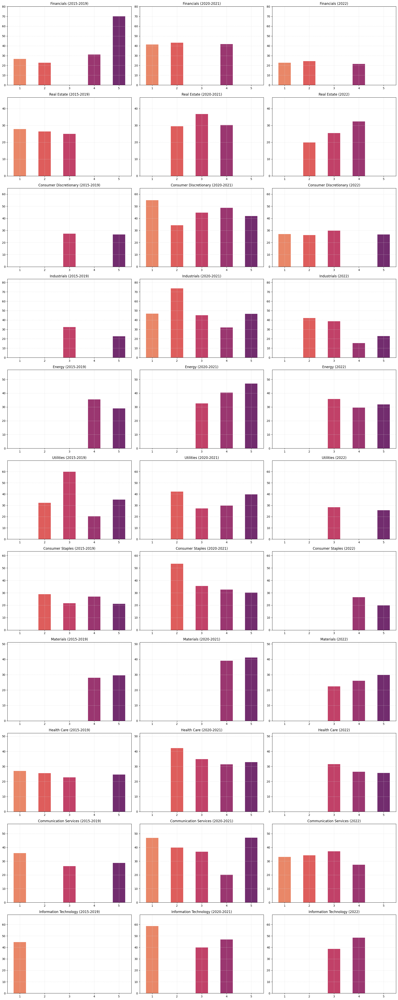

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

fig, axs = plt.subplots(11, 3, figsize=(20, 50))
axs = axs.flatten()     # Flatten the axs array since you have 3x11 subplots

palette = sns.color_palette("flare", df['quintiles_e'].nunique())

i = 0

for sector in sectors:
    sector_2019 = df[(df['sector'] == sector) & (df['year'] <= 2019)].groupby(['quintiles_e'])['VOLATILITY_260D_CALC'].mean()
    sector_2020 = df[(df['sector'] == sector) & (df['year'] > 2019) & (df['year'] <= 2021)].groupby(['quintiles_e'])['VOLATILITY_260D_CALC'].mean()
    sector_2021 = df[(df['sector'] == sector) & (df['year'] == 2022)].groupby(['quintiles_e'])['VOLATILITY_260D_CALC'].mean()
    sector_2019.plot(kind='bar', ax=axs[i], color=palette, grid=True)
    axs[i].set_title(sector + ' (2015-2019)')
    sector_2020.plot(kind='bar', ax=axs[i+1], color=palette, grid=True)
    axs[i+1].set_title(sector + ' (2020-2021)')
    sector_2021.plot(kind='bar', ax=axs[i+2], color=palette, grid=True)
    axs[i+2].set_title(sector + ' (2022)')


    max_vol = max(sector_2019.max(), sector_2020.max(), sector_2021.max())

    for ax in [axs[i], axs[i+1], axs[i+2]]:
        ax.set_xlabel('')
        ax.set_ylim(0 , max_vol +10)  # Set common y-axis limits
        ax.set_xticklabels(range(1,6), rotation=0)
        ax.grid(True, linestyle='--', linewidth=0.5, color='lightgray')

    i += 3

plt.tight_layout()  # Adjust layout for better spacing
plt.show()


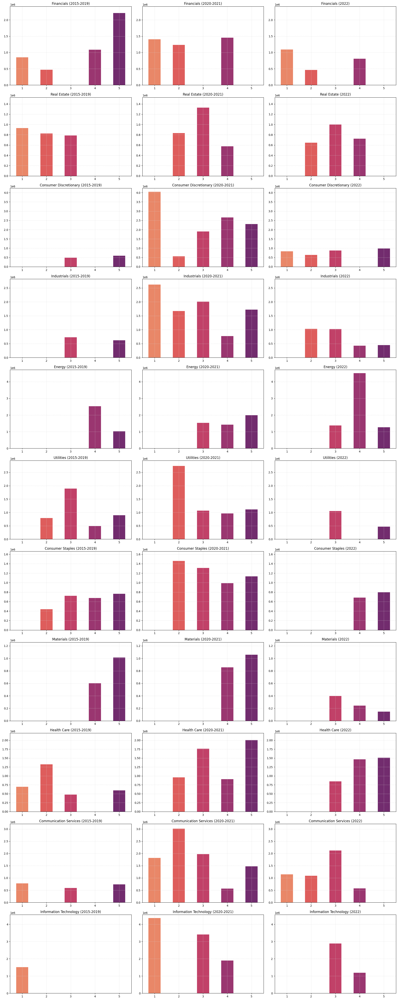

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

fig, axs = plt.subplots(11, 3, figsize=(20, 50))
axs = axs.flatten()     # Flatten the axs array since you have 3x11 subplots

palette = sns.color_palette("flare", df['quintiles_e'].nunique())

i = 0

for sector in sectors:
    sector_2019 = df[(df['sector'] == sector) & (df['year'] <= 2019)].groupby(['quintiles_e'])['LIQUIDITY'].mean()
    sector_2020 = df[(df['sector'] == sector) & (df['year'] > 2019) & (df['year'] <= 2021)].groupby(['quintiles_e'])['LIQUIDITY'].mean()
    sector_2021 = df[(df['sector'] == sector) & (df['year'] == 2022)].groupby(['quintiles_e'])['LIQUIDITY'].mean()
    sector_2019.plot(kind='bar', ax=axs[i], color=palette, grid=True)
    axs[i].set_title(sector + ' (2015-2019)')
    sector_2020.plot(kind='bar', ax=axs[i+1], color=palette, grid=True)
    axs[i+1].set_title(sector + ' (2020-2021)')
    sector_2021.plot(kind='bar', ax=axs[i+2], color=palette, grid=True)
    axs[i+2].set_title(sector + ' (2022)')


    min_liq = min(sector_2019.min(), sector_2020.min(), sector_2021.min())
    max_liq = max(sector_2019.max(), sector_2020.max(), sector_2021.max())

    for ax in [axs[i], axs[i+1], axs[i+2]]:
        ax.set_xlabel('')
        ax.set_ylim(0 , max_liq +200000)  # Set common y-axis limits
        ax.set_xticklabels(range(1,6), rotation=0)
        ax.grid(True, linestyle='--', linewidth=0.5, color='lightgray')

    i += 3

plt.tight_layout()  # Adjust layout for better spacing
plt.show()


# 🆂 quintile Social score

##comparing Q1 and 5 Over Time

In [ ]:
df['quintiles_s'] = pd.qcut(df['esg_S'], 5 , labels=(range(1,6)))
df[['quintiles_s', 'esg_S', 'RETURN']]

,quintiles_s,esg_S,RETURN
0,4,4.21,0.19
1,4,4.66,0.12
2,4,3.69,-0.26
3,3,3.39,-0.04
4,4,3.76,0.26
...,...,...,...
439,2,1.99,0.01
440,2,1.97,-0.08
441,2,1.45,-0.01
442,1,1.00,-0.36


In [ ]:
mean_returns_s = df.groupby(['quintiles_s', 'year'])['RETURN'].mean().unstack(level=0)
mean_returns_s

quintiles_s,1,2,3,4,5
year,,,,,
2015,0.008571,-0.168571,-0.058000,-0.136000,-0.215000
2016,0.098000,0.185455,0.305000,0.245000,0.181250
2017,0.076000,0.198889,0.175714,0.212000,0.264444
2018,-0.222222,0.001000,-0.117500,-0.145000,-0.191000
2019,-0.049000,0.342000,-0.016875,0.098571,0.052000
2020,0.128333,0.013000,-0.068667,-0.170000,-0.170909
2021,0.311111,0.267391,0.138000,0.198077,0.149091
2022,-0.126154,-0.008462,0.153125,-0.037826,-0.031333


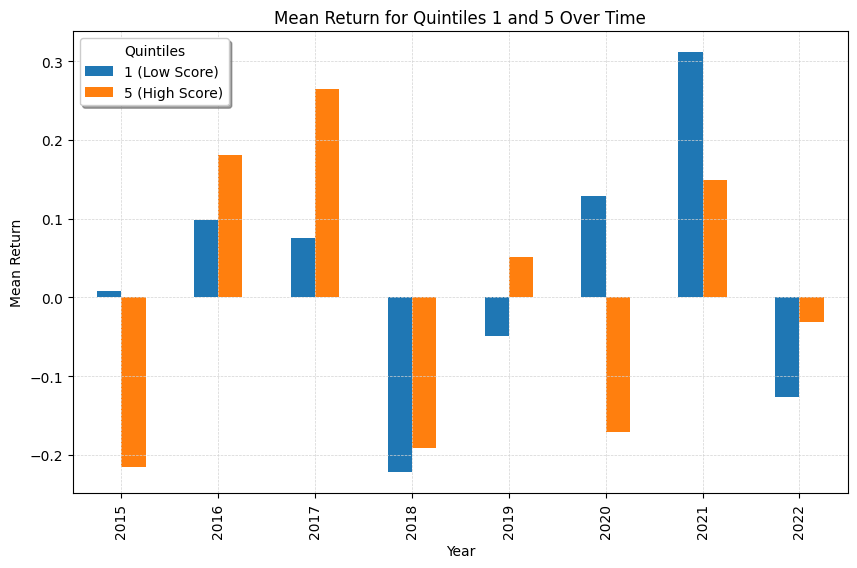

In [ ]:
import matplotlib.pyplot as plt

mean_returns_s = df.groupby(['quintiles_s', 'year'])['RETURN'].mean().unstack(level=0)

# Plotting only quintiles 1 and 5
mean_returns_s[[1, 5]].plot(kind='bar', figsize=(10, 6))

plt.grid(True, linestyle='--', linewidth=0.5, color='lightgray')
plt.xlabel('Year')
plt.ylabel('Mean Return')
plt.title('Mean Return for Quintiles 1 and 5 Over Time')
plt.legend( ['1 (Low Score)', '5 (High Score)'], title='Quintiles', loc='upper left', bbox_to_anchor=(0, 1),
          ncol=1, fancybox=True, shadow=True)

plt.show()


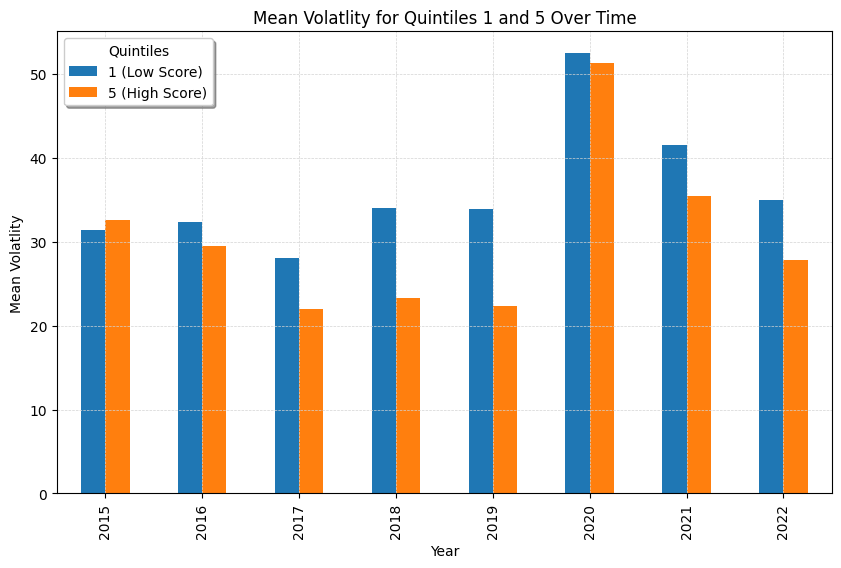

In [ ]:
# Plotting only quintiles 1 and 5
mean_vol_s = df.groupby(['quintiles_s', 'year'])['VOLATILITY_260D_CALC'].mean().unstack(level=0)
mean_vol_s[[1, 5]].plot(kind='bar', figsize=(10, 6))

plt.grid(True, linestyle='--', linewidth=0.5, color='lightgray')
plt.xlabel('Year')
plt.ylabel('Mean Volatlity')
plt.title('Mean Volatlity for Quintiles 1 and 5 Over Time')
plt.legend( ['1 (Low Score)', '5 (High Score)'], title='Quintiles', loc='upper left', bbox_to_anchor=(0, 1),
          ncol=1, fancybox=True, shadow=True)

plt.show()


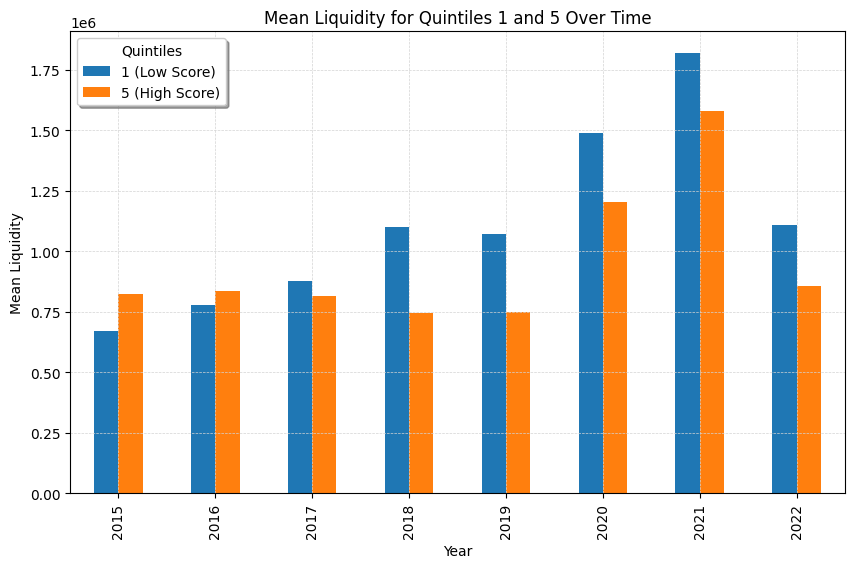

In [ ]:
# Plotting only quintiles 1 and 5
mean_liq_s = df.groupby(['quintiles_s', 'year'])['LIQUIDITY'].mean().unstack(level=0)
mean_liq_s[[1, 5]].plot(kind='bar', figsize=(10, 6))

plt.grid(True, linestyle='--', linewidth=0.5, color='lightgray')
plt.xlabel('Year')
plt.ylabel('Mean Liquidity')
plt.title('Mean Liquidity for Quintiles 1 and 5 Over Time')
plt.legend( ['1 (Low Score)', '5 (High Score)'], title='Quintiles', loc='upper left', bbox_to_anchor=(0, 1),
          ncol=1, fancybox=True, shadow=True)

plt.show()


##sector

In [ ]:
df.groupby(['quintiles_s', 'sector'])['RETURN'].mean().unstack(level=0)

quintiles_s,1,2,3,4,5
sector,,,,,
Communication Services,-0.105294,-0.020000,-0.097500,0.265000,-0.035000
Consumer Discretionary,0.216667,0.067143,0.484286,0.065833,-0.011667
Consumer Staples,0.003125,0.070000,0.010000,-0.050000,NaN
Energy,NaN,0.330000,-0.140000,-0.004286,-0.002727
Financials,0.114286,0.050357,-0.027778,-0.015789,0.093333
Health Care,0.104286,0.330000,0.020000,-0.670000,0.410000
Industrials,0.010000,0.248000,0.037778,0.135000,0.078889
Information Technology,0.250000,0.316000,NaN,NaN,NaN
Materials,NaN,0.058750,0.112222,0.023333,0.037000


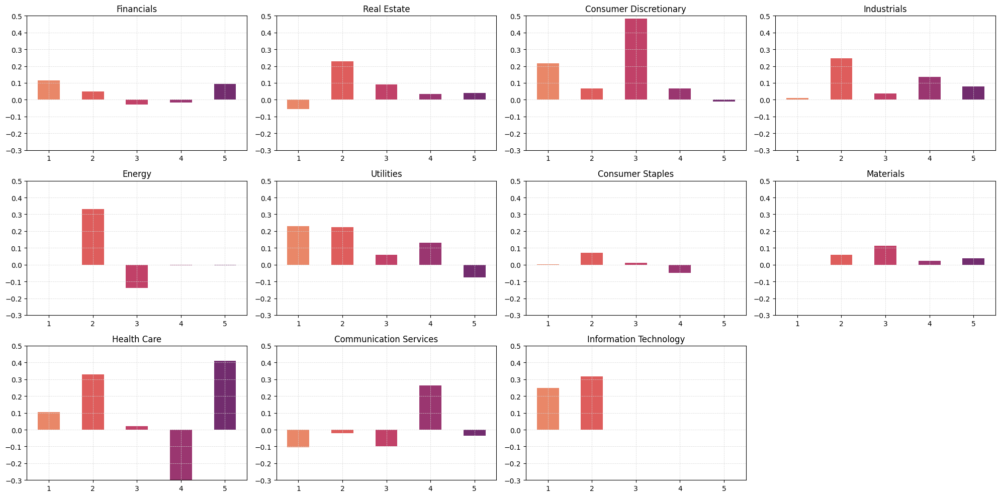

In [ ]:
import seaborn as sns

palette = sns.color_palette("flare", df['quintiles_s'].nunique())

fig, axs = plt.subplots(3, 4, figsize=(20, 10))
axs = axs.flatten()
axs[11].axis('off')

# Iterate through sectors and plot bar plots
for i, sector in enumerate(sectors):
    # Group data by 'quintiles' and calculate the mean of 'RETURN'
    sector_data = df[df['sector'] == sector].groupby('quintiles_s')['RETURN'].mean()
    # Plot bar plot for each sector on the corresponding subplot
    sector_data.plot(kind='bar', ax=axs[i], color=palette, grid=True)
    axs[i].set_title(sector)
    axs[i].set_xlabel('')
    axs[i].xaxis.grid(True)
    axs[i].set_xticklabels(range(1,6), rotation=0)
    axs[i].set_ylim(-0.3, 0.5)  # Set common y-axis limits
    axs[i].grid(True, linestyle='--', linewidth=0.5, color='lightgray')

plt.tight_layout()  # Adjust layout for better spacing
plt.show()


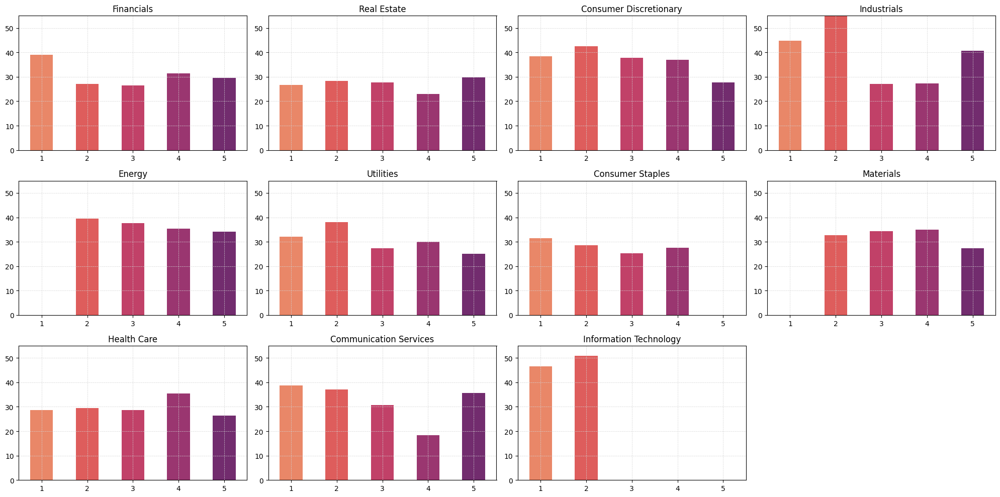

In [ ]:
import seaborn as sns

palette = sns.color_palette("flare", df['quintiles_s'].nunique())

fig, axs = plt.subplots(3, 4, figsize=(20, 10))
axs = axs.flatten()
axs[11].axis('off')

# Iterate through sectors and plot bar plots
for i, sector in enumerate(sectors):
    # Group data by 'quintiles' and calculate the mean of 'Volatility'
    sector_data = df[df['sector'] == sector].groupby('quintiles_s')['VOLATILITY_260D_CALC'].mean()
    # Plot bar plot for each sector on the corresponding subplot
    sector_data.plot(kind='bar', ax=axs[i], color=palette, grid=True)
    axs[i].set_title(sector)
    axs[i].set_xlabel('')
    axs[i].xaxis.grid(True)
    axs[i].set_xticklabels(range(1,6), rotation=0)
    axs[i].set_ylim(0, 55)  # Set common y-axis limits
    axs[i].grid(True, linestyle='--', linewidth=0.5, color='lightgray')

plt.tight_layout()  # Adjust layout for better spacing
plt.show()


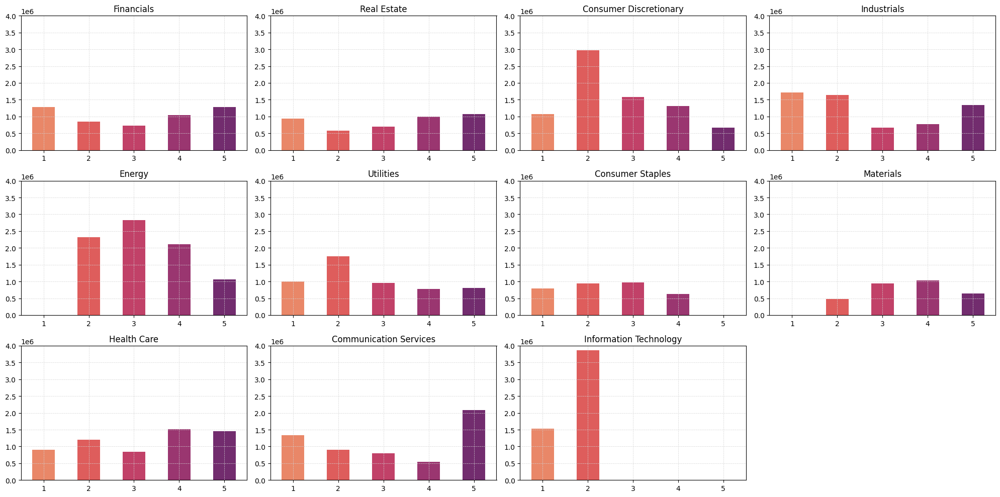

In [ ]:
import seaborn as sns

palette = sns.color_palette("flare", df['quintiles_s'].nunique())

fig, axs = plt.subplots(3, 4, figsize=(20, 10))
axs = axs.flatten()  # Flatten the axs array since you have 3x4 subplots

axs[11].axis('off')

# Iterate through sectors and plot bar plots
for i, sector in enumerate(sectors):
    # Group data by 'quintiles' and calculate the mean of 'RETURN'
    sector_data = df[df['sector'] == sector].groupby('quintiles_s')['LIQUIDITY'].mean()
    # Plot bar plot for each sector on the corresponding subplot
    sector_data.plot(kind='bar', ax=axs[i], color=palette, grid=True)
    axs[i].set_title(sector)
    axs[i].set_xlabel('')
    # axs[i].set_ylabel('Mean Return')
    axs[i].xaxis.grid(True)
    #axs[i].get_xaxis().set_visible(True)
    axs[i].set_xticklabels(range(1,6), rotation=0)
    axs[i].set_ylim(0, 4000000)  # Set common y-axis limits
    axs[i].grid(True, linestyle='--', linewidth=0.5, color='lightgray')

plt.tight_layout()  # Adjust layout for better spacing
plt.show()


## Pre, covid, Post covid

In [ ]:
df[(df['year'] <= 2019)].groupby(['quintiles_s', 'year'])['RETURN'].mean().unstack(level=0)

quintiles_s,1,2,3,4,5
year,,,,,
2015,0.008571,-0.168571,-0.058000,-0.136000,-0.215000
2016,0.098000,0.185455,0.305000,0.245000,0.181250
2017,0.076000,0.198889,0.175714,0.212000,0.264444
2018,-0.222222,0.001000,-0.117500,-0.145000,-0.191000
2019,-0.049000,0.342000,-0.016875,0.098571,0.052000


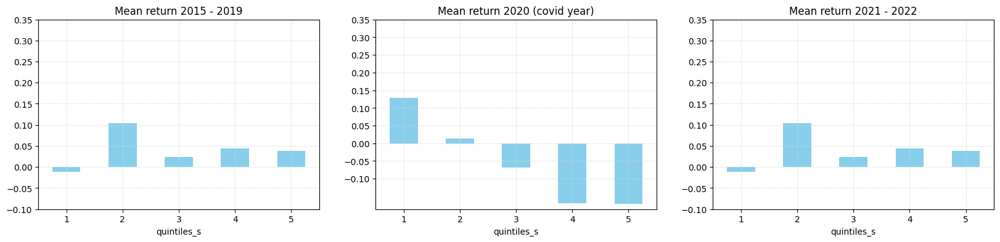

In [ ]:
import matplotlib.pyplot as plt

fig, axs = plt.subplots(1, 3, figsize=(20, 4))

# Group by quintiles and calculate mean for each subgroup
data_2019 = df[df['year'] <= 2019].groupby(['quintiles_s'])['RETURN'].mean()
data_2020_2021 = df[(df['year'] == 2020) & (df['year'] <= 2021)].groupby(['quintiles_s'])['RETURN'].mean()
data_2022 = df[df['year'] < 2020].groupby(['quintiles_s'])['RETURN'].mean()

# Plotting the data for each year in separate subplots
data_2019.plot(kind='bar', color='skyblue', grid='true', ax=axs[0])
data_2020_2021.plot(kind='bar', color='skyblue', grid='true', ax=axs[1])
data_2022.plot(kind='bar', color='skyblue', grid='true', ax=axs[2])

axs[0].set_title('Mean return 2015 - 2019')
axs[1].set_title('Mean return 2020 (covid year)')
axs[2].set_title('Mean return 2021 - 2022')

# Set common x and y ticks for all subplots
for ax in axs:
    ax.set_yticks(np.arange(-0.1, 0.4, 0.05))
    ax.set_xticklabels(range(1,6), rotation=0)
    ax.grid(True, linestyle='--', linewidth=0.5, color='lightgray')

plt.show()

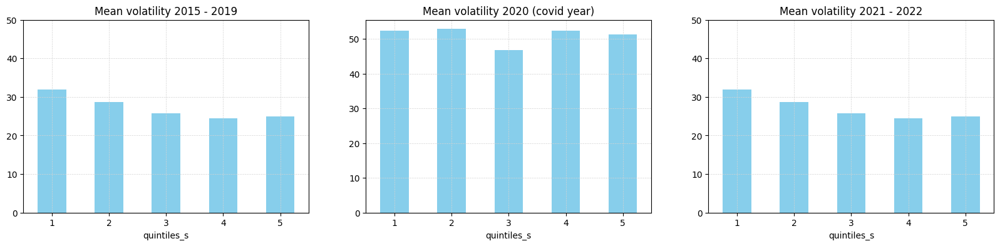

In [ ]:
import matplotlib.pyplot as plt

fig, axs = plt.subplots(1, 3, figsize=(20, 4))

# Group by quintiles and calculate mean for each subgroup
data_2019 = df[df['year'] <= 2019].groupby(['quintiles_s'])['VOLATILITY_260D_CALC'].mean()
data_2020_2021 = df[(df['year'] == 2020)].groupby(['quintiles_s'])['VOLATILITY_260D_CALC'].mean()
data_2022 = df[df['year'] < 2020].groupby(['quintiles_s'])['VOLATILITY_260D_CALC'].mean()

# Plotting the data for each year in separate subplots
data_2019.plot(kind='bar', color='skyblue', grid='true', ax=axs[0])
data_2020_2021.plot(kind='bar', color='skyblue', grid='true', ax=axs[1])
data_2022.plot(kind='bar', color='skyblue', grid='true', ax=axs[2])

axs[0].set_title('Mean volatility 2015 - 2019')
axs[1].set_title('Mean volatility 2020 (covid year)')
axs[2].set_title('Mean volatility 2021 - 2022')

# Set common x and y ticks for all subplots
for ax in axs:
    ax.set_yticks(np.arange(0, 60, 10))
    ax.set_xticklabels(range(1,6), rotation=0)
    ax.grid(True, linestyle='--', linewidth=0.5, color='lightgray')

plt.show()

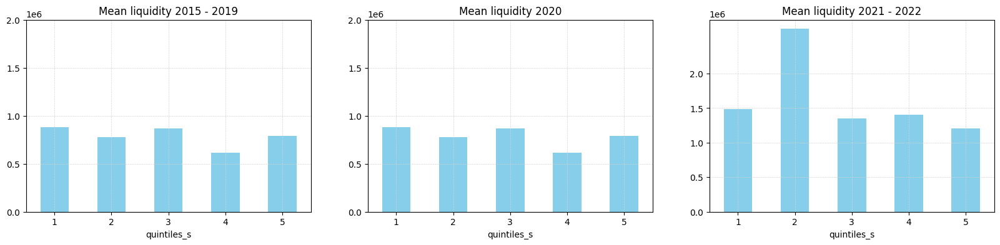

In [ ]:
import matplotlib.pyplot as plt

fig, axs = plt.subplots(1, 3, figsize=(20, 4))

# Group by quintiles and calculate mean for each subgroup
data_2019 = df[df['year'] <= 2019].groupby(['quintiles_s'])['LIQUIDITY'].mean()
data_2022 = df[df['year'] == 2020].groupby(['quintiles_s'])['LIQUIDITY'].mean()
data_2020_2021 = df[(df['year'] < 2020)].groupby(['quintiles_s'])['LIQUIDITY'].mean()

# Plotting the data for each year in separate subplots
data_2019.plot(kind='bar', color='skyblue', grid='true', ax=axs[0])
data_2020_2021.plot(kind='bar', color='skyblue', grid='true', ax=axs[1])
data_2022.plot(kind='bar', color='skyblue', grid='true', ax=axs[2])

axs[0].set_title('Mean liquidity 2015 - 2019')
axs[1].set_title('Mean liquidity 2020')
axs[2].set_title('Mean liquidity 2021 - 2022')

# Set common x and y ticks for all subplots
for ax in axs:
    ax.set_yticks(np.arange(0, 2500000, 500000))
    ax.set_xticklabels(range(1,6), rotation=0)
    ax.grid(True, linestyle='--', linewidth=0.5, color='lightgray')

plt.show()

## Pre, covid, Post covid & sector


In [ ]:
sectors

['Financials',
 'Real Estate',
 'Consumer Discretionary',
 'Industrials',
 'Energy',
 'Utilities',
 'Consumer Staples',
 'Materials',
 'Health Care',
 'Communication Services',
 'Information Technology']

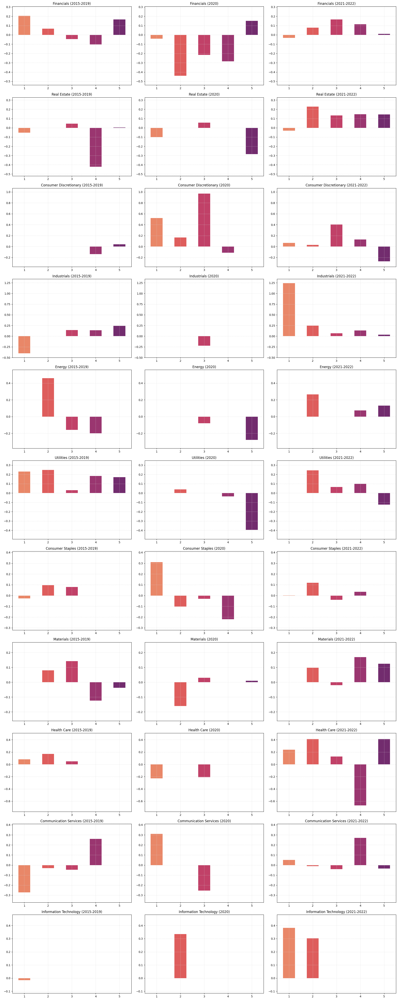

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

fig, axs = plt.subplots(11, 3, figsize=(20, 50))
axs = axs.flatten()     # Flatten the axs array since you have 3x11 subplots

palette = sns.color_palette("flare", df['quintiles_s'].nunique())

i = 0

for sector in sectors:
    sector_2019 = df[(df['sector'] == sector) & (df['year'] <= 2019)].groupby(['quintiles_s'])['RETURN'].mean()
    sector_2020 = df[(df['sector'] == sector) & (df['year'] == 2020) & (df['year'] <= 2021)].groupby(['quintiles_s'])['RETURN'].mean()
    sector_2021 = df[(df['sector'] == sector) & (df['year'] > 2020)].groupby(['quintiles_s'])['RETURN'].mean()
    sector_2019.plot(kind='bar', ax=axs[i], color=palette, grid=True)
    axs[i].set_title(sector + ' (2015-2019)')
    sector_2020.plot(kind='bar', ax=axs[i+1], color=palette, grid=True)
    axs[i+1].set_title(sector + ' (2020)')
    sector_2021.plot(kind='bar', ax=axs[i+2], color=palette, grid=True)
    axs[i+2].set_title(sector + ' (2021-2022)')

    min_return = min(sector_2019.min(), sector_2020.min(), sector_2021.min())
    max_return = max(sector_2019.max(), sector_2020.max(), sector_2021.max())

    for ax in [axs[i], axs[i+1], axs[i+2]]:
        ax.set_xlabel('')
        ax.set_ylim(min_return -0.1 , max_return +0.1)  # Set common y-axis limits
        ax.set_xticklabels(range(1,6), rotation=0)
        ax.grid(True, linestyle='--', linewidth=0.5, color='lightgray')

    i += 3

plt.tight_layout()  # Adjust layout for better spacing
plt.show()


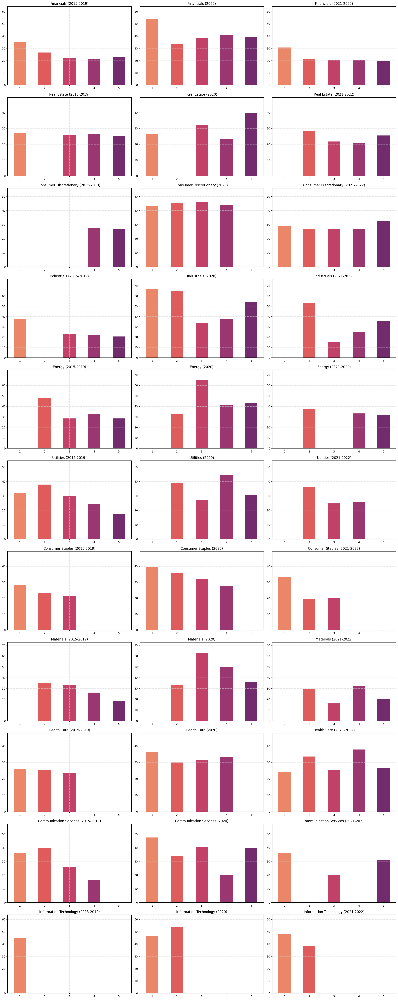

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

fig, axs = plt.subplots(11, 3, figsize=(20, 50))
axs = axs.flatten()     # Flatten the axs array since you have 3x11 subplots

palette = sns.color_palette("flare", df['quintiles_s'].nunique())

i = 0

for sector in sectors:
    sector_2019 = df[(df['sector'] == sector) & (df['year'] <= 2019)].groupby(['quintiles_s'])['VOLATILITY_260D_CALC'].mean()
    sector_2020 = df[(df['sector'] == sector) & (df['year'] > 2019) & (df['year'] <= 2021)].groupby(['quintiles_s'])['VOLATILITY_260D_CALC'].mean()
    sector_2021 = df[(df['sector'] == sector) & (df['year'] == 2022)].groupby(['quintiles_s'])['VOLATILITY_260D_CALC'].mean()
    sector_2019.plot(kind='bar', ax=axs[i], color=palette, grid=True)
    axs[i].set_title(sector + ' (2015-2019)')
    sector_2020.plot(kind='bar', ax=axs[i+1], color=palette, grid=True)
    axs[i+1].set_title(sector + ' (2020)')
    sector_2021.plot(kind='bar', ax=axs[i+2], color=palette, grid=True)
    axs[i+2].set_title(sector + ' (2021-2022)')


    max_vol = max(sector_2019.max(), sector_2020.max(), sector_2021.max())

    for ax in [axs[i], axs[i+1], axs[i+2]]:
        ax.set_xlabel('')
        ax.set_ylim(0 , max_vol +10)  # Set common y-axis limits
        ax.set_xticklabels(range(1,6), rotation=0)
        ax.grid(True, linestyle='--', linewidth=0.5, color='lightgray')

    i += 3

plt.tight_layout()  # Adjust layout for better spacing
plt.show()


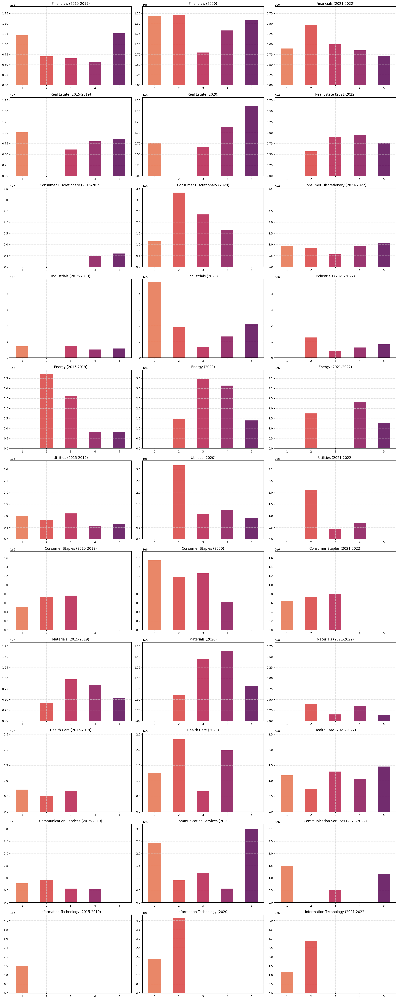

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

fig, axs = plt.subplots(11, 3, figsize=(20, 50))
axs = axs.flatten()     # Flatten the axs array since you have 3x11 subplots

palette = sns.color_palette("flare", df['quintiles_s'].nunique())

i = 0

for sector in sectors:
    sector_2019 = df[(df['sector'] == sector) & (df['year'] <= 2019)].groupby(['quintiles_s'])['LIQUIDITY'].mean()
    sector_2020 = df[(df['sector'] == sector) & (df['year'] > 2019) & (df['year'] <= 2021)].groupby(['quintiles_s'])['LIQUIDITY'].mean()
    sector_2021 = df[(df['sector'] == sector) & (df['year'] == 2022)].groupby(['quintiles_s'])['LIQUIDITY'].mean()
    sector_2019.plot(kind='bar', ax=axs[i], color=palette, grid=True)
    axs[i].set_title(sector + ' (2015-2019)')
    sector_2020.plot(kind='bar', ax=axs[i+1], color=palette, grid=True)
    axs[i+1].set_title(sector + ' (2020)')
    sector_2021.plot(kind='bar', ax=axs[i+2], color=palette, grid=True)
    axs[i+2].set_title(sector + ' (2021-2022)')


    min_liq = min(sector_2019.min(), sector_2020.min(), sector_2021.min())
    max_liq = max(sector_2019.max(), sector_2020.max(), sector_2021.max())

    for ax in [axs[i], axs[i+1], axs[i+2]]:
        ax.set_xlabel('')
        ax.set_ylim(0 , max_liq +200000)  # Set common y-axis limits
        ax.set_xticklabels(range(1,6), rotation=0)
        ax.grid(True, linestyle='--', linewidth=0.5, color='lightgray')

    i += 3

plt.tight_layout()  # Adjust layout for better spacing
plt.show()


# 🅶 quintile Governance score

##comparing Q1 and 5 Over Time

In [ ]:
df['quintiles_g'] = pd.qcut(df['esg_G'], 5 , labels=(range(1,6)))
df[['quintiles_g', 'esg_S', 'RETURN']]

,quintiles_g,esg_S,RETURN
0,2,4.21,0.19
1,1,4.66,0.12
2,4,3.69,-0.26
3,5,3.39,-0.04
4,4,3.76,0.26
...,...,...,...
439,5,1.99,0.01
440,5,1.97,-0.08
441,3,1.45,-0.01
442,3,1.00,-0.36


In [ ]:
mean_returns_g = df.groupby(['quintiles_g', 'year'])['RETURN'].mean().unstack(level=0)
mean_returns_g

quintiles_g,1,2,3,4,5
year,,,,,
2015,-0.069000,-0.145556,0.100000,-0.242500,-0.086667
2016,0.221111,0.211250,0.080000,0.111667,0.251429
2017,0.095000,0.192500,0.120000,0.212500,0.287000
2018,-0.114444,-0.108889,-0.276250,-0.104286,-0.076000
2019,-0.024000,-0.072000,0.200000,0.092500,0.081000
2020,-0.176667,-0.135833,0.185000,-0.046667,-0.080000
2021,0.231579,0.223158,0.166923,0.258261,0.182727
2022,0.017500,0.102143,0.060000,-0.127000,-0.086364


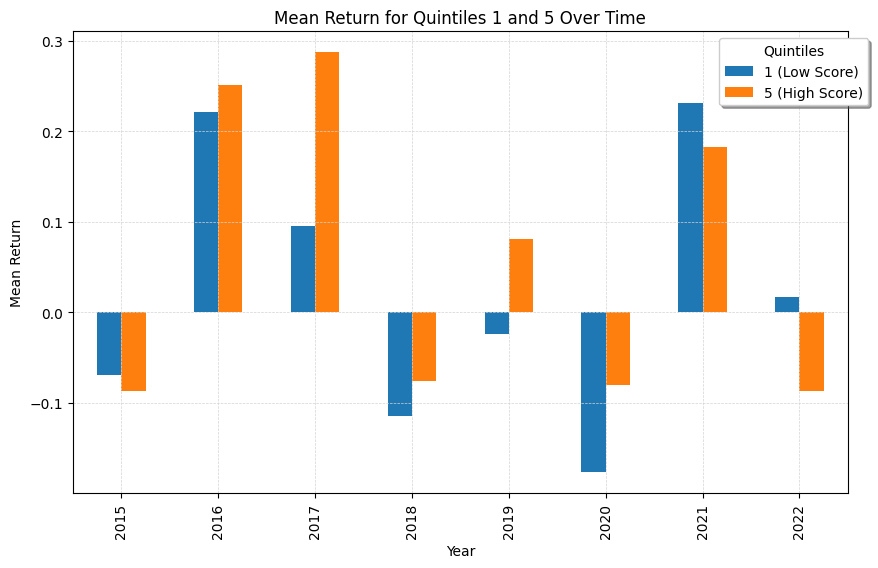

In [ ]:
import matplotlib.pyplot as plt

mean_returns_g = df.groupby(['quintiles_g', 'year'])['RETURN'].mean().unstack(level=0)

# Plotting only quintiles 1 and 5
mean_returns_g[[1, 5]].plot(kind='bar', figsize=(10, 6))

plt.grid(True, linestyle='--', linewidth=0.5, color='lightgray')
plt.xlabel('Year')
plt.ylabel('Mean Return')
plt.title('Mean Return for Quintiles 1 and 5 Over Time')
plt.legend( ['1 (Low Score)', '5 (High Score)'], title='Quintiles', loc='upper left', bbox_to_anchor=(0.825, 1),
          ncol=1, fancybox=True, shadow=True)

plt.show()


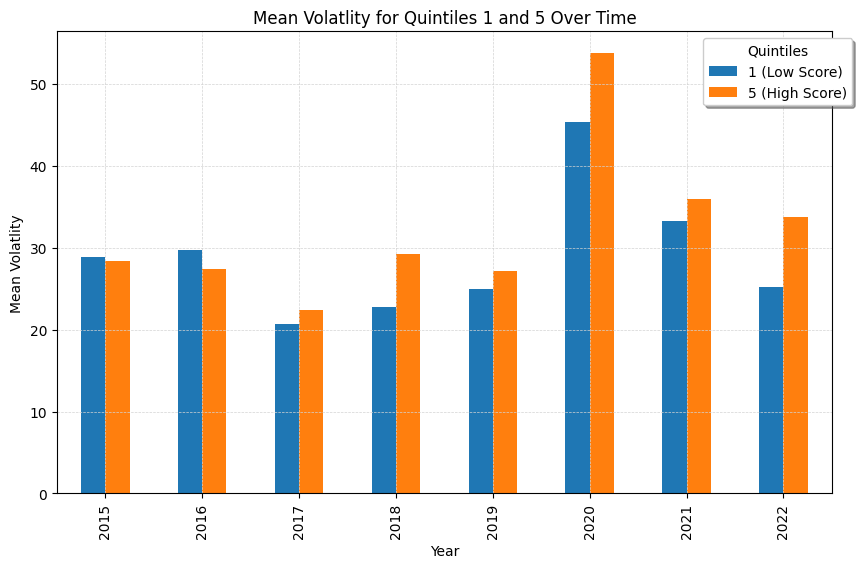

In [ ]:
# Plotting only quintiles 1 and 5
mean_vol_g = df.groupby(['quintiles_g', 'year'])['VOLATILITY_260D_CALC'].mean().unstack(level=0)
mean_vol_g[[1, 5]].plot(kind='bar', figsize=(10, 6))

plt.grid(True, linestyle='--', linewidth=0.5, color='lightgray')
plt.xlabel('Year')
plt.ylabel('Mean Volatlity')
plt.title('Mean Volatlity for Quintiles 1 and 5 Over Time')
plt.legend( ['1 (Low Score)', '5 (High Score)'], title='Quintiles', loc='upper left', bbox_to_anchor=(0.825, 1),
          ncol=1, fancybox=True, shadow=True)

plt.show()


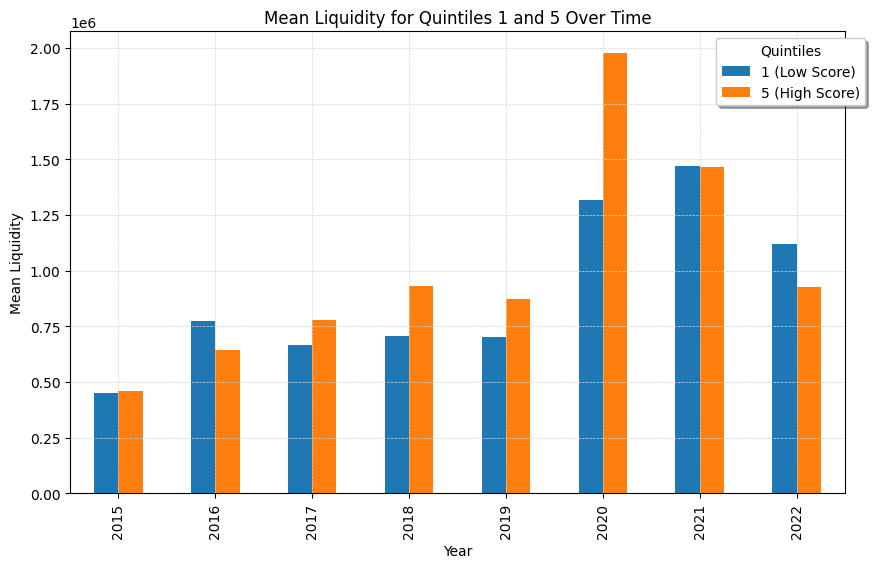

In [ ]:
# Plotting only quintiles 1 and 5
mean_liq_g = df.groupby(['quintiles_g', 'year'])['LIQUIDITY'].mean().unstack(level=0)
mean_liq_g[[1, 5]].plot(kind='bar', figsize=(10, 6))

plt.grid(True, linestyle='--', linewidth=0.5, color='lightgray')
plt.xlabel('Year')
plt.ylabel('Mean Liquidity')
plt.title('Mean Liquidity for Quintiles 1 and 5 Over Time')
plt.legend( ['1 (Low Score)', '5 (High Score)'], title='Quintiles', loc='upper left', bbox_to_anchor=(0.825, 1),
          ncol=1, fancybox=True, shadow=True)

plt.show()


##sector

In [ ]:
df.groupby(['quintiles_g', 'sector'])['RETURN'].mean().unstack(level=0)

quintiles_g,1,2,3,4,5
sector,,,,,
Communication Services,-0.083750,-0.115000,-0.266667,0.080000,0.270000
Consumer Discretionary,0.030000,0.084286,0.296250,0.143333,0.246667
Consumer Staples,0.009500,-0.033750,0.005000,0.416667,-0.035000
Energy,0.260000,NaN,0.168333,-0.100000,0.003684
Financials,-0.002941,-0.102105,0.124500,0.037826,0.155000
Health Care,0.051000,0.138333,0.184444,-0.670000,NaN
Industrials,0.082222,0.275000,-0.380000,-0.150000,0.109286
Information Technology,0.360000,0.247500,NaN,0.274000,NaN
Materials,0.160000,0.019000,0.238571,-0.005000,-0.035000


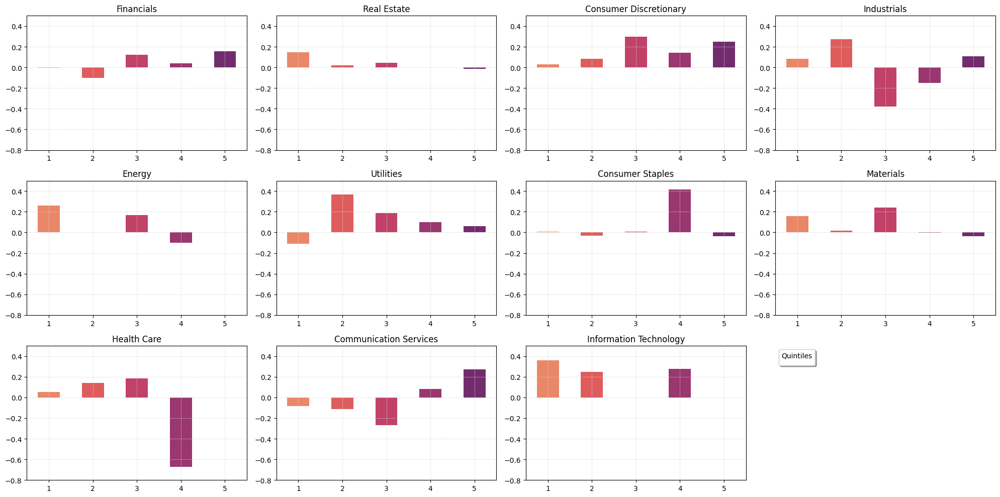

In [ ]:
import seaborn as sns

palette = sns.color_palette("flare", df['quintiles_g'].nunique())

fig, axs = plt.subplots(3, 4, figsize=(20, 10))
axs = axs.flatten()
axs[11].axis('off')

# Iterate through sectors and plot bar plots
for i, sector in enumerate(sectors):
    # Group data by 'quintiles' and calculate the mean of 'RETURN'
    sector_data = df[df['sector'] == sector].groupby('quintiles_g')['RETURN'].mean()
    # Plot bar plot for each sector on the corresponding subplot
    sector_data.plot(kind='bar', ax=axs[i], color=palette, grid=True)
    axs[i].set_title(sector)
    axs[i].set_xlabel('')
    axs[i].xaxis.grid(True)
    axs[i].set_xticklabels(range(1,6), rotation=0)
    axs[i].set_ylim(-0.8, 0.5)  # Set common y-axis limits
    axs[i].grid(True, linestyle='--', linewidth=0.5, color='lightgray')


plt.tight_layout()  # Adjust layout for better spacing
plt.show()


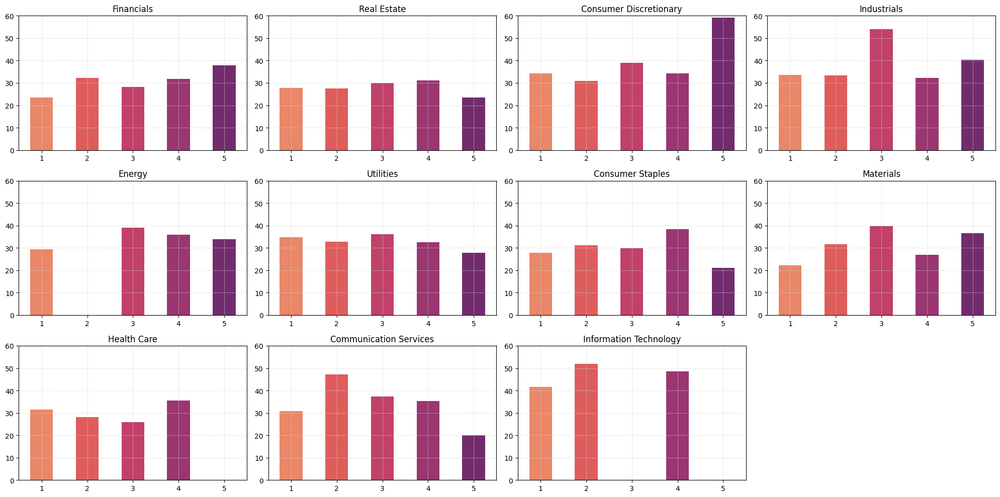

In [ ]:
import seaborn as sns

palette = sns.color_palette("flare", df['quintiles_g'].nunique())

fig, axs = plt.subplots(3, 4, figsize=(20, 10))
axs = axs.flatten()
axs[11].axis('off')

# Iterate through sectors and plot bar plots
for i, sector in enumerate(sectors):
    # Group data by 'quintiles' and calculate the mean of 'RETURN'
    sector_data = df[df['sector'] == sector].groupby('quintiles_g')['VOLATILITY_260D_CALC'].mean()
    # Plot bar plot for each sector on the corresponding subplot
    sector_data.plot(kind='bar', ax=axs[i], color=palette, grid=True)
    axs[i].set_title(sector)
    axs[i].set_xlabel('')
    # axs[i].set_ylabel('Mean Return')
    axs[i].xaxis.grid(True)
    #axs[i].get_xaxis().set_visible(True)
    axs[i].set_xticklabels(range(1,6), rotation=0)
    axs[i].set_ylim(0, 60)  # Set common y-axis limits
    axs[i].grid(True, linestyle='--', linewidth=0.5, color='lightgray')

plt.tight_layout()  # Adjust layout for better spacing
plt.show()


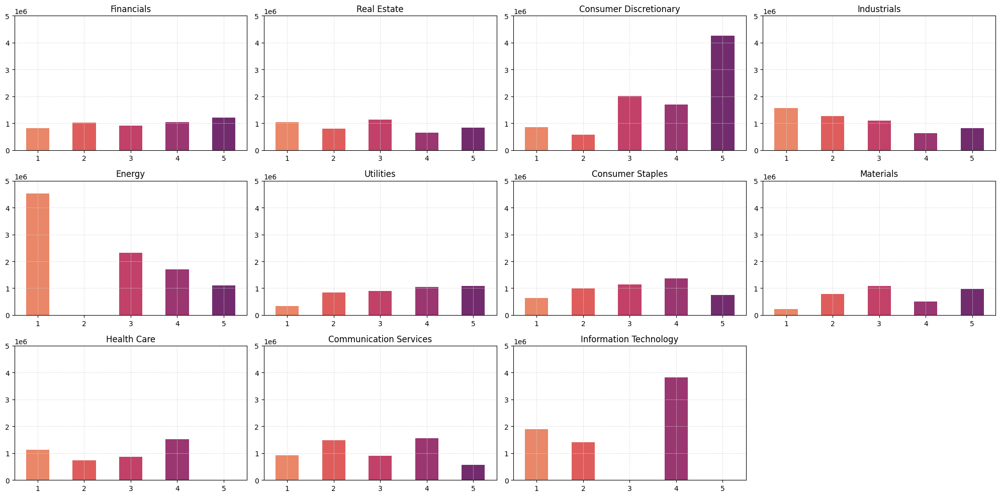

In [ ]:
import seaborn as sns

palette = sns.color_palette("flare", df['quintiles_g'].nunique())

fig, axs = plt.subplots(3, 4, figsize=(20, 10))
axs = axs.flatten()  # Flatten the axs array since you have 3x4 subplots

axs[11].axis('off')

# Iterate through sectors and plot bar plots
for i, sector in enumerate(sectors):
    # Group data by 'quintiles' and calculate the mean of 'RETURN'
    sector_data = df[df['sector'] == sector].groupby('quintiles_g')['LIQUIDITY'].mean()
    # Plot bar plot for each sector on the corresponding subplot
    sector_data.plot(kind='bar', ax=axs[i], color=palette, grid=True)
    axs[i].set_title(sector)
    axs[i].set_xlabel('')
    # axs[i].set_ylabel('Mean Return')
    axs[i].xaxis.grid(True)
    #axs[i].get_xaxis().set_visible(True)
    axs[i].set_xticklabels(range(1,6), rotation=0)
    axs[i].set_ylim(0, 5000000)  # Set common y-axis limits
    axs[i].grid(True, linestyle='--', linewidth=0.5, color='lightgray')

plt.tight_layout()  # Adjust layout for better spacing
plt.show()


## Pre, covid, Post covid

In [ ]:
df[(df['year'] <= 2019)].groupby(['quintiles_g', 'year'])['RETURN'].mean().unstack(level=0)

quintiles_g,1,2,3,4,5
year,,,,,
2015,-0.069000,-0.145556,0.10000,-0.242500,-0.086667
2016,0.221111,0.211250,0.08000,0.111667,0.251429
2017,0.095000,0.192500,0.12000,0.212500,0.287000
2018,-0.114444,-0.108889,-0.27625,-0.104286,-0.076000
2019,-0.024000,-0.072000,0.20000,0.092500,0.081000


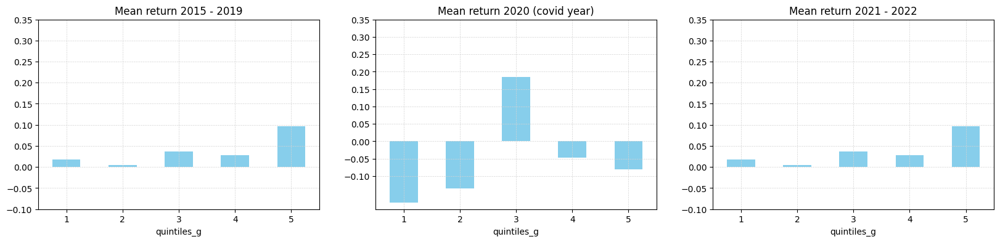

In [ ]:
import matplotlib.pyplot as plt

fig, axs = plt.subplots(1, 3, figsize=(20, 4))

# Group by quintiles and calculate mean for each subgroup
data_2019 = df[df['year'] <= 2019].groupby(['quintiles_g'])['RETURN'].mean()
data_2020_2021 = df[(df['year'] == 2020) & (df['year'] <= 2021)].groupby(['quintiles_g'])['RETURN'].mean()
data_2022 = df[df['year'] < 2020].groupby(['quintiles_g'])['RETURN'].mean()

# Plotting the data for each year in separate subplots
data_2019.plot(kind='bar', color='skyblue', grid='true', ax=axs[0])
data_2020_2021.plot(kind='bar', color='skyblue', grid='true', ax=axs[1])
data_2022.plot(kind='bar', color='skyblue', grid='true', ax=axs[2])

axs[0].set_title('Mean return 2015 - 2019')
axs[1].set_title('Mean return 2020 (covid year)')
axs[2].set_title('Mean return 2021 - 2022')

# Set common x and y ticks for all subplots
for ax in axs:
    ax.set_yticks(np.arange(-0.1, 0.4, 0.05))
    ax.set_xticklabels(range(1,6), rotation=0)
    ax.grid(True, linestyle='--', linewidth=0.5, color='lightgray')

plt.show()

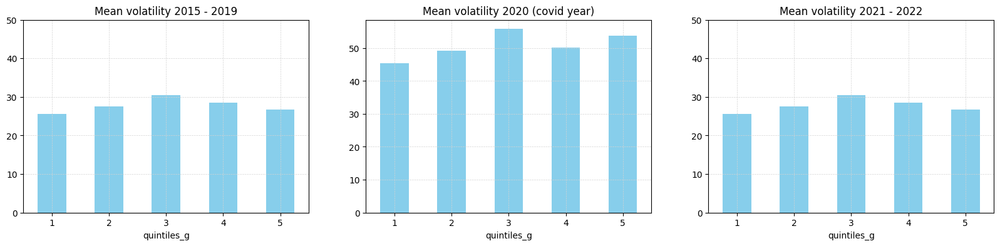

In [ ]:
import matplotlib.pyplot as plt

fig, axs = plt.subplots(1, 3, figsize=(20, 4))

# Group by quintiles and calculate mean for each subgroup
data_2019 = df[df['year'] <= 2019].groupby(['quintiles_g'])['VOLATILITY_260D_CALC'].mean()
data_2020_2021 = df[(df['year'] == 2020)].groupby(['quintiles_g'])['VOLATILITY_260D_CALC'].mean()
data_2022 = df[df['year'] < 2020].groupby(['quintiles_g'])['VOLATILITY_260D_CALC'].mean()

# Plotting the data for each year in separate subplots
data_2019.plot(kind='bar', color='skyblue', grid='true', ax=axs[0])
data_2020_2021.plot(kind='bar', color='skyblue', grid='true', ax=axs[1])
data_2022.plot(kind='bar', color='skyblue', grid='true', ax=axs[2])

axs[0].set_title('Mean volatility 2015 - 2019')
axs[1].set_title('Mean volatility 2020 (covid year)')
axs[2].set_title('Mean volatility 2021 - 2022')

# Set common x and y ticks for all subplots
for ax in axs:
    ax.set_yticks(np.arange(0, 60, 10))
    ax.set_xticklabels(range(1,6), rotation=0)
    ax.grid(True, linestyle='--', linewidth=0.5, color='lightgray')

plt.show()

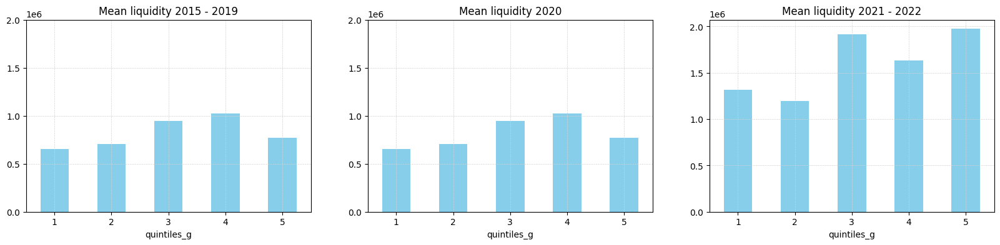

In [ ]:
import matplotlib.pyplot as plt

fig, axs = plt.subplots(1, 3, figsize=(20, 4))

# Group by quintiles and calculate mean for each subgroup
data_2019 = df[df['year'] <= 2019].groupby(['quintiles_g'])['LIQUIDITY'].mean()
data_2022 = df[df['year'] == 2020].groupby(['quintiles_g'])['LIQUIDITY'].mean()
data_2020_2021 = df[(df['year'] < 2020)].groupby(['quintiles_g'])['LIQUIDITY'].mean()

# Plotting the data for each year in separate subplots
data_2019.plot(kind='bar', color='skyblue', grid='true', ax=axs[0])
data_2020_2021.plot(kind='bar', color='skyblue', grid='true', ax=axs[1])
data_2022.plot(kind='bar', color='skyblue', grid='true', ax=axs[2])

axs[0].set_title('Mean liquidity 2015 - 2019')
axs[1].set_title('Mean liquidity 2020')
axs[2].set_title('Mean liquidity 2021 - 2022')

# Set common x and y ticks for all subplots
for ax in axs:
    ax.set_yticks(np.arange(0, 2500000, 500000))
    ax.set_xticklabels(range(1,6), rotation=0)
    ax.grid(True, linestyle='--', linewidth=0.5, color='lightgray')

plt.show()

## Pre, covid, Post covid & sector


In [ ]:
sectors

['Financials',
 'Real Estate',
 'Consumer Discretionary',
 'Industrials',
 'Energy',
 'Utilities',
 'Consumer Staples',
 'Materials',
 'Health Care',
 'Communication Services',
 'Information Technology']

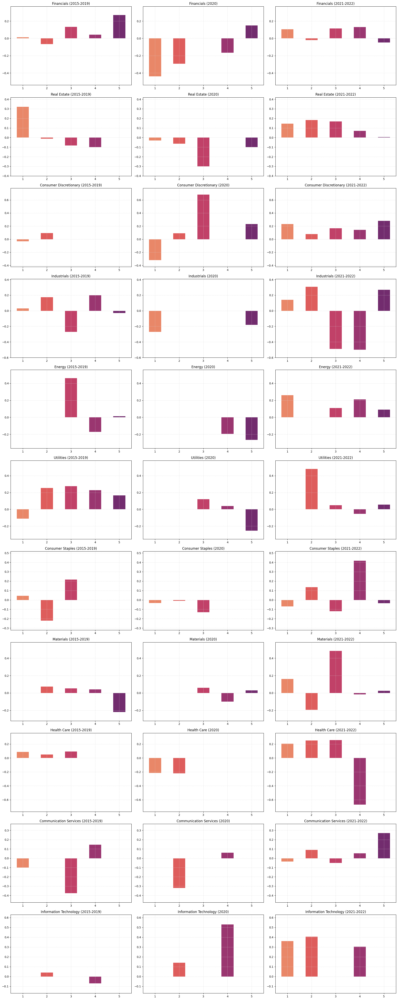

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

fig, axs = plt.subplots(11, 3, figsize=(20, 50))
axs = axs.flatten()     # Flatten the axs array since you have 3x11 subplots

palette = sns.color_palette("flare", df['quintiles_g'].nunique())

i = 0

for sector in sectors:
    sector_2019 = df[(df['sector'] == sector) & (df['year'] <= 2019)].groupby(['quintiles_g'])['RETURN'].mean()
    sector_2020 = df[(df['sector'] == sector) & (df['year'] == 2020) & (df['year'] <= 2021)].groupby(['quintiles_g'])['RETURN'].mean()
    sector_2021 = df[(df['sector'] == sector) & (df['year'] > 2020)].groupby(['quintiles_g'])['RETURN'].mean()
    sector_2019.plot(kind='bar', ax=axs[i], color=palette, grid=True)
    axs[i].set_title(sector + ' (2015-2019)')
    sector_2020.plot(kind='bar', ax=axs[i+1], color=palette, grid=True)
    axs[i+1].set_title(sector + ' (2020)')
    sector_2021.plot(kind='bar', ax=axs[i+2], color=palette, grid=True)
    axs[i+2].set_title(sector + ' (2021-2022)')

    min_return = min(sector_2019.min(), sector_2020.min(), sector_2021.min())
    max_return = max(sector_2019.max(), sector_2020.max(), sector_2021.max())

    for ax in [axs[i], axs[i+1], axs[i+2]]:
        ax.set_xlabel('')
        ax.set_ylim(min_return -0.1 , max_return +0.1)  # Set common y-axis limits
        ax.set_xticklabels(range(1,6), rotation=0)
        ax.grid(True, linestyle='--', linewidth=0.5, color='lightgray')

    i += 3

plt.tight_layout()  # Adjust layout for better spacing
plt.show()


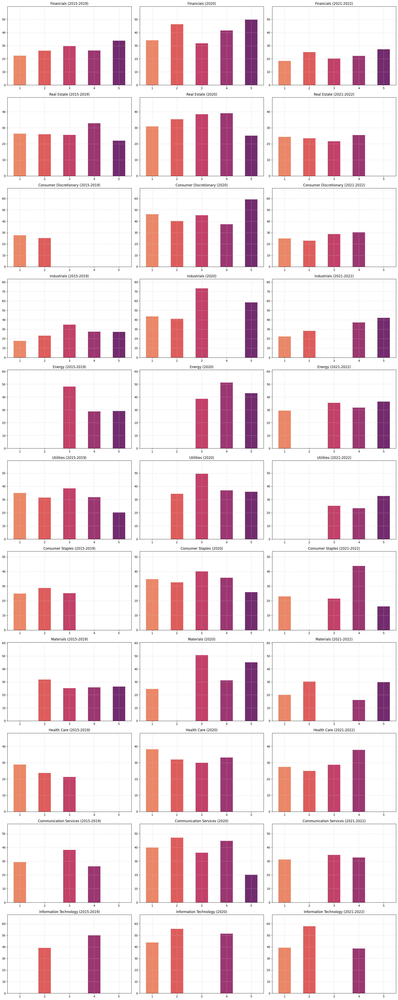

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

fig, axs = plt.subplots(11, 3, figsize=(20, 50))
axs = axs.flatten()     # Flatten the axs array since you have 3x11 subplots

palette = sns.color_palette("flare", df['quintiles_g'].nunique())

i = 0

for sector in sectors:
    sector_2019 = df[(df['sector'] == sector) & (df['year'] <= 2019)].groupby(['quintiles_g'])['VOLATILITY_260D_CALC'].mean()
    sector_2020 = df[(df['sector'] == sector) & (df['year'] > 2019) & (df['year'] <= 2021)].groupby(['quintiles_g'])['VOLATILITY_260D_CALC'].mean()
    sector_2021 = df[(df['sector'] == sector) & (df['year'] == 2022)].groupby(['quintiles_g'])['VOLATILITY_260D_CALC'].mean()
    sector_2019.plot(kind='bar', ax=axs[i], color=palette, grid=True)
    axs[i].set_title(sector + ' (2015-2019)')
    sector_2020.plot(kind='bar', ax=axs[i+1], color=palette, grid=True)
    axs[i+1].set_title(sector + ' (2020)')
    sector_2021.plot(kind='bar', ax=axs[i+2], color=palette, grid=True)
    axs[i+2].set_title(sector + ' (2021-2022)')


    max_vol = max(sector_2019.max(), sector_2020.max(), sector_2021.max())

    for ax in [axs[i], axs[i+1], axs[i+2]]:
        ax.set_xlabel('')
        ax.set_ylim(0 , max_vol +10)  # Set common y-axis limits
        ax.set_xticklabels(range(1,6), rotation=0)
        ax.grid(True, linestyle='--', linewidth=0.5, color='lightgray')

    i += 3

plt.tight_layout()  # Adjust layout for better spacing
plt.show()


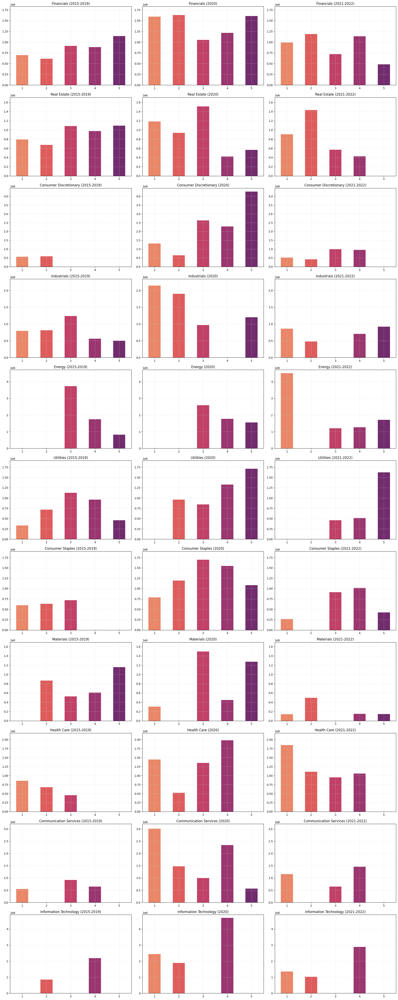

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

fig, axs = plt.subplots(11, 3, figsize=(20, 50))
axs = axs.flatten()     # Flatten the axs array since you have 3x11 subplots

palette = sns.color_palette("flare", df['quintiles_s'].nunique())

i = 0

for sector in sectors:
    sector_2019 = df[(df['sector'] == sector) & (df['year'] <= 2019)].groupby(['quintiles_g'])['LIQUIDITY'].mean()
    sector_2020 = df[(df['sector'] == sector) & (df['year'] > 2019) & (df['year'] <= 2021)].groupby(['quintiles_g'])['LIQUIDITY'].mean()
    sector_2021 = df[(df['sector'] == sector) & (df['year'] == 2022)].groupby(['quintiles_g'])['LIQUIDITY'].mean()
    sector_2019.plot(kind='bar', ax=axs[i], color=palette, grid=True)
    axs[i].set_title(sector + ' (2015-2019)')
    sector_2020.plot(kind='bar', ax=axs[i+1], color=palette, grid=True)
    axs[i+1].set_title(sector + ' (2020)')
    sector_2021.plot(kind='bar', ax=axs[i+2], color=palette, grid=True)
    axs[i+2].set_title(sector + ' (2021-2022)')


    min_liq = min(sector_2019.min(), sector_2020.min(), sector_2021.min())
    max_liq = max(sector_2019.max(), sector_2020.max(), sector_2021.max())

    for ax in [axs[i], axs[i+1], axs[i+2]]:
        ax.set_xlabel('')
        ax.set_ylim(0 , max_liq +200000)  # Set common y-axis limits
        ax.set_xticklabels(range(1,6), rotation=0)
        ax.grid(True, linestyle='--', linewidth=0.5, color='lightgray')

    i += 3

plt.tight_layout()  # Adjust layout for better spacing
plt.show()


#**scatter**

##Overall score

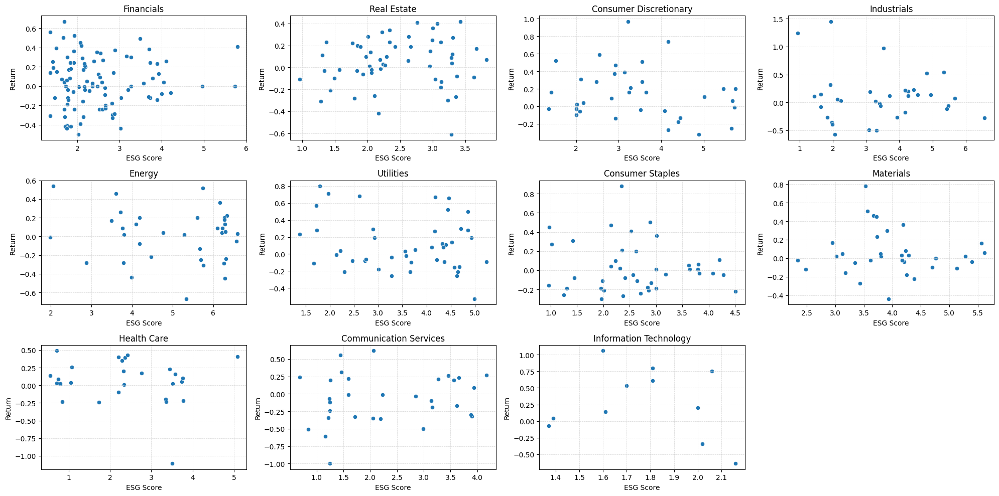

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

fig, axs = plt.subplots(3, 4, figsize=(20, 10))
axs = axs.flatten()

axs[11].axis('off')

for i, sector in enumerate(sectors):
    sector_data = df[df['sector'] == sector]
    sns.scatterplot(data=sector_data, x='esg_OVERALL', y='RETURN', ax=axs[i])
    axs[i].set_title(sector)
    axs[i].set_xlabel('ESG Score')
    axs[i].set_ylabel('Return')
    axs[i].grid(True, linestyle='--', linewidth=0.5, color='lightgray')

plt.tight_layout()  # Adjust layout for better spacing
plt.show()


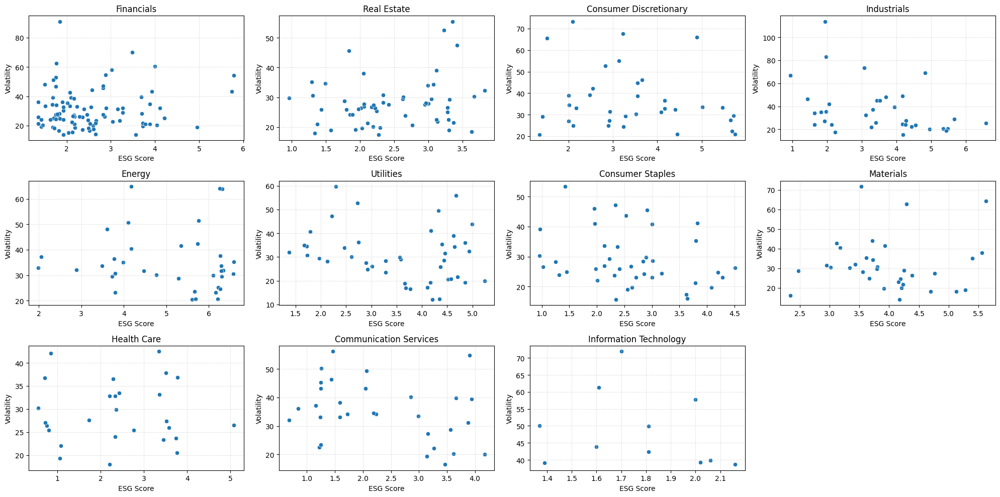

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

fig, axs = plt.subplots(3, 4, figsize=(20, 10))
axs = axs.flatten()

axs[11].axis('off')

for i, sector in enumerate(sectors):
    sector_data = df[df['sector'] == sector]
    sns.scatterplot(data=sector_data, x='esg_OVERALL', y='VOLATILITY_260D_CALC', ax=axs[i])
    axs[i].set_title(sector)
    axs[i].set_xlabel('ESG Score')
    axs[i].set_ylabel('Volatility')
    axs[i].grid(True, linestyle='--', linewidth=0.5, color='lightgray')

plt.tight_layout()  # Adjust layout for better spacing
plt.show()


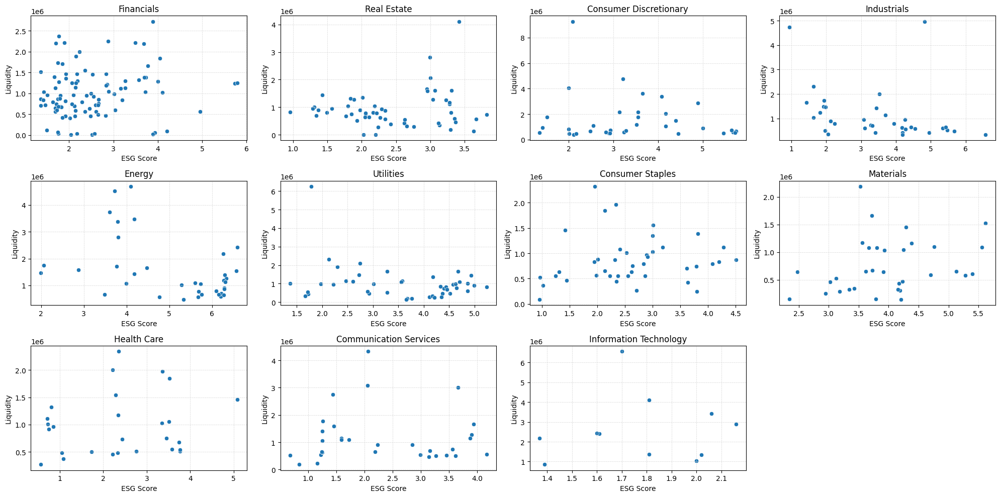

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

fig, axs = plt.subplots(3, 4, figsize=(20, 10))
axs = axs.flatten()

axs[11].axis('off')

for i, sector in enumerate(sectors):
    sector_data = df[df['sector'] == sector]
    sns.scatterplot(data=sector_data, x='esg_OVERALL', y='LIQUIDITY', ax=axs[i])
    axs[i].set_title(sector)
    axs[i].set_xlabel('ESG Score')
    axs[i].set_ylabel('Liquidity')
    axs[i].grid(True, linestyle='--', linewidth=0.5, color='lightgray')

plt.tight_layout()  # Adjust layout for better spacing
plt.show()


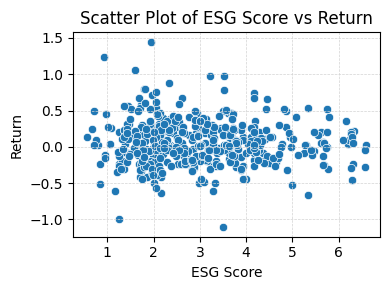

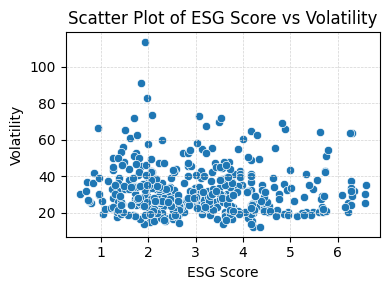

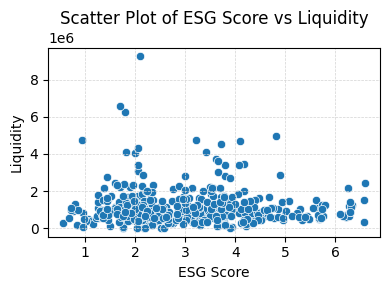

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(4, 3))
# Scatter plot ESG score against Return
sns.scatterplot(data=df, x='esg_OVERALL', y='RETURN')
plt.title('Scatter Plot of ESG Score vs Return')
plt.xlabel('ESG Score')
plt.ylabel('Return')
plt.grid(True, linestyle='--', linewidth=0.5, color='lightgray')
plt.tight_layout()  # Adjust layout for better spacing
plt.show()

plt.figure(figsize=(4, 3))
# Scatter plot ESG score against Volatility
sns.scatterplot(data=df, x='esg_OVERALL', y='VOLATILITY_260D_CALC')
plt.title('Scatter Plot of ESG Score vs Volatility')
plt.xlabel('ESG Score')
plt.ylabel('Volatility')
plt.grid(True, linestyle='--', linewidth=0.5, color='lightgray')
plt.tight_layout()  # Adjust layout for better spacing
plt.show()

plt.figure(figsize=(4, 3))
# Scatter plot ESG score against Volatility
sns.scatterplot(data=df, x='esg_OVERALL', y='LIQUIDITY')
plt.title('Scatter Plot of ESG Score vs Liquidity')
plt.xlabel('ESG Score')
plt.ylabel('Liquidity')
plt.grid(True, linestyle='--', linewidth=0.5, color='lightgray')
plt.tight_layout()  # Adjust layout for better spacing
plt.show()

##Environmental  score

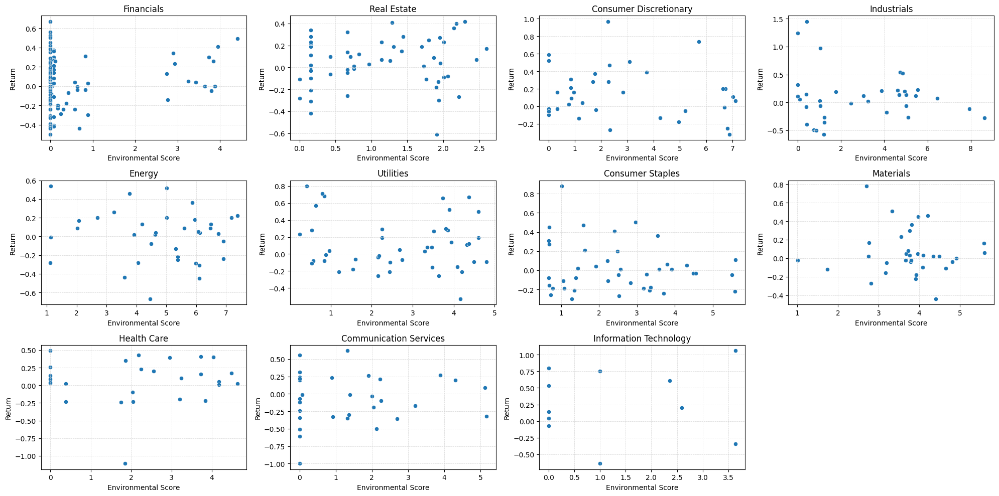

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

fig, axs = plt.subplots(3, 4, figsize=(20, 10))
axs = axs.flatten()

axs[11].axis('off')

for i, sector in enumerate(sectors):
    sector_data = df[df['sector'] == sector]
    sns.scatterplot(data=sector_data, x='esg_E', y='RETURN', ax=axs[i])
    axs[i].set_title(sector)
    axs[i].set_xlabel('Environmental Score')
    axs[i].set_ylabel('Return')
    axs[i].grid(True, linestyle='--', linewidth=0.5, color='lightgray')

plt.tight_layout()  # Adjust layout for better spacing
plt.show()


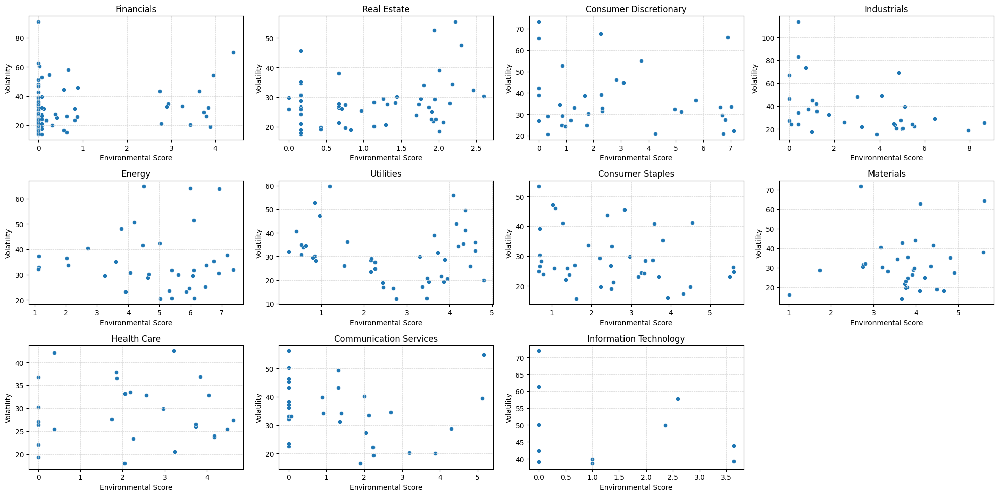

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

fig, axs = plt.subplots(3, 4, figsize=(20, 10))
axs = axs.flatten()

axs[11].axis('off')

for i, sector in enumerate(sectors):
    sector_data = df[df['sector'] == sector]
    sns.scatterplot(data=sector_data, x='esg_E', y='VOLATILITY_260D_CALC', ax=axs[i])
    axs[i].set_title(sector)
    axs[i].set_xlabel('Environmental Score')
    axs[i].set_ylabel('Volatility')
    axs[i].grid(True, linestyle='--', linewidth=0.5, color='lightgray')

plt.tight_layout()  # Adjust layout for better spacing
plt.show()


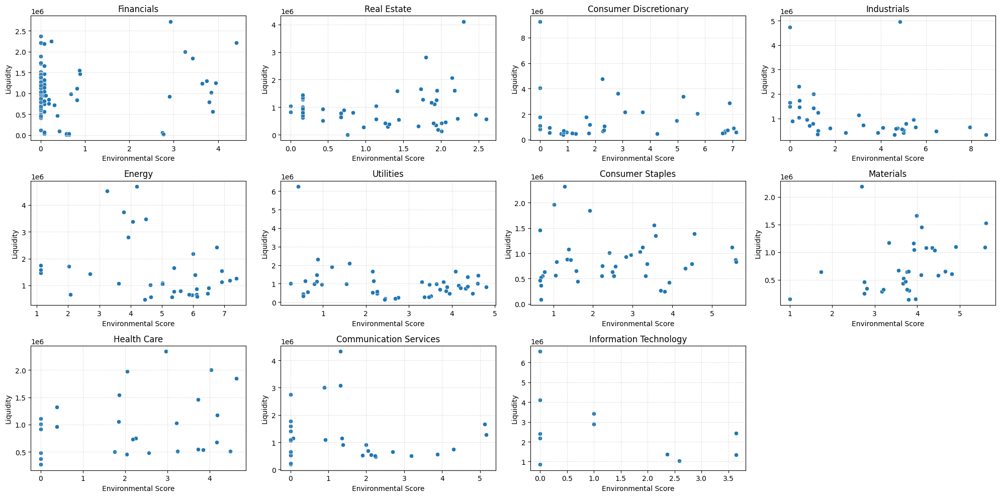

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

fig, axs = plt.subplots(3, 4, figsize=(20, 10))
axs = axs.flatten()

axs[11].axis('off')

for i, sector in enumerate(sectors):
    sector_data = df[df['sector'] == sector]
    sns.scatterplot(data=sector_data, x='esg_E', y='LIQUIDITY', ax=axs[i])
    axs[i].set_title(sector)
    axs[i].set_xlabel('Environmental Score')
    axs[i].set_ylabel('Liquidity')
    axs[i].grid(True, linestyle='--', linewidth=0.5, color='lightgray')

plt.tight_layout()  # Adjust layout for better spacing
plt.show()


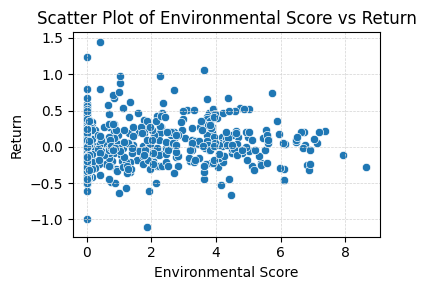

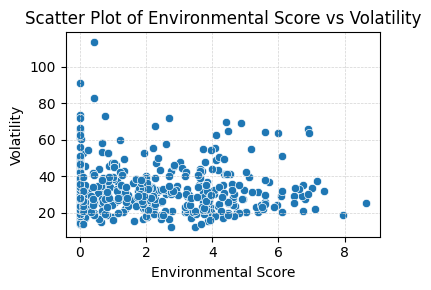

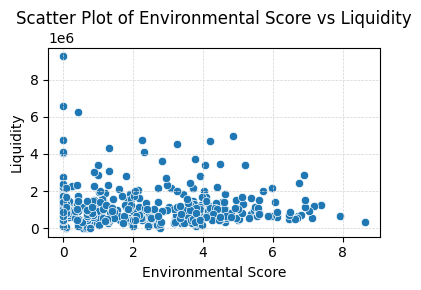

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(4, 3))
# Scatter plot ESG score against Return
sns.scatterplot(data=df, x='esg_E', y='RETURN')
plt.title('Scatter Plot of Environmental Score vs Return')
plt.xlabel('Environmental Score')
plt.ylabel('Return')
plt.grid(True, linestyle='--', linewidth=0.5, color='lightgray')
plt.tight_layout()  # Adjust layout for better spacing
plt.show()

plt.figure(figsize=(4, 3))
# Scatter plot ESG score against Volatility
sns.scatterplot(data=df, x='esg_E', y='VOLATILITY_260D_CALC')
plt.title('Scatter Plot of Environmental Score vs Volatility')
plt.xlabel('Environmental Score')
plt.ylabel('Volatility')
plt.grid(True, linestyle='--', linewidth=0.5, color='lightgray')
plt.tight_layout()  # Adjust layout for better spacing
plt.show()

plt.figure(figsize=(4, 3))
# Scatter plot ESG score against Volatility
sns.scatterplot(data=df, x='esg_E', y='LIQUIDITY')
plt.title('Scatter Plot of Environmental Score vs Liquidity')
plt.xlabel('Environmental Score')
plt.ylabel('Liquidity')
plt.grid(True, linestyle='--', linewidth=0.5, color='lightgray')
plt.tight_layout()  # Adjust layout for better spacing
plt.show()

##Social  score

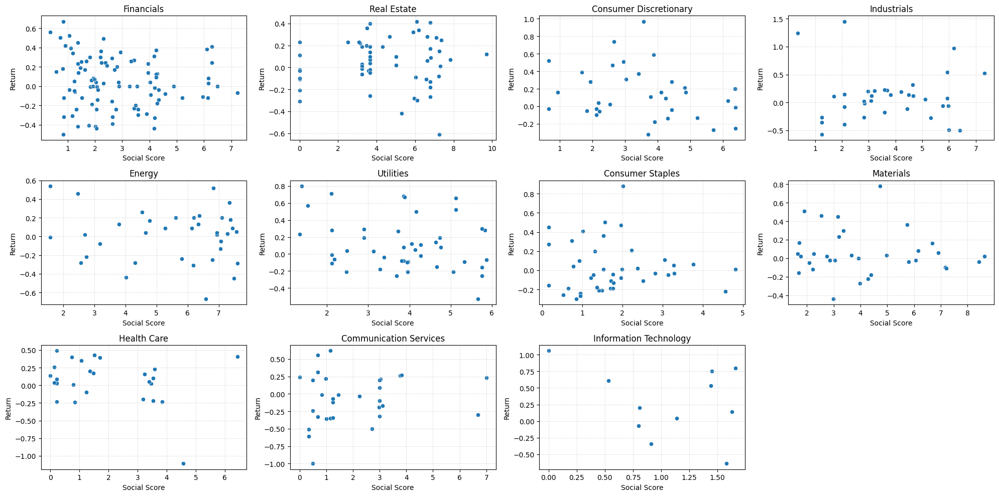

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

fig, axs = plt.subplots(3, 4, figsize=(20, 10))
axs = axs.flatten()
axs[11].axis('off')

for i, sector in enumerate(sectors):
    sector_data = df[df['sector'] == sector]
    sns.scatterplot(data=sector_data, x='esg_S', y='RETURN', ax=axs[i])
    axs[i].set_title(sector)
    axs[i].set_xlabel('Social Score')
    axs[i].set_ylabel('Return')
    axs[i].grid(True, linestyle='--', linewidth=0.5, color='lightgray')

plt.tight_layout()  # Adjust layout for better spacing
plt.show()


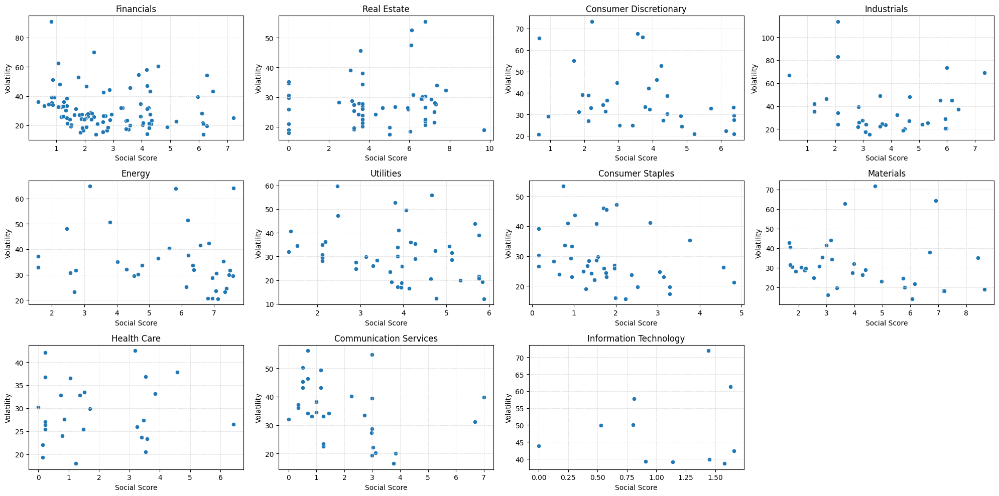

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

fig, axs = plt.subplots(3, 4, figsize=(20, 10))
axs = axs.flatten()

axs[11].axis('off')

for i, sector in enumerate(sectors):
    sector_data = df[df['sector'] == sector]
    sns.scatterplot(data=sector_data, x='esg_S', y='VOLATILITY_260D_CALC', ax=axs[i])
    axs[i].set_title(sector)
    axs[i].set_xlabel('Social Score')
    axs[i].set_ylabel('Volatility')
    axs[i].grid(True, linestyle='--', linewidth=0.5, color='lightgray')

plt.tight_layout()  # Adjust layout for better spacing
plt.show()


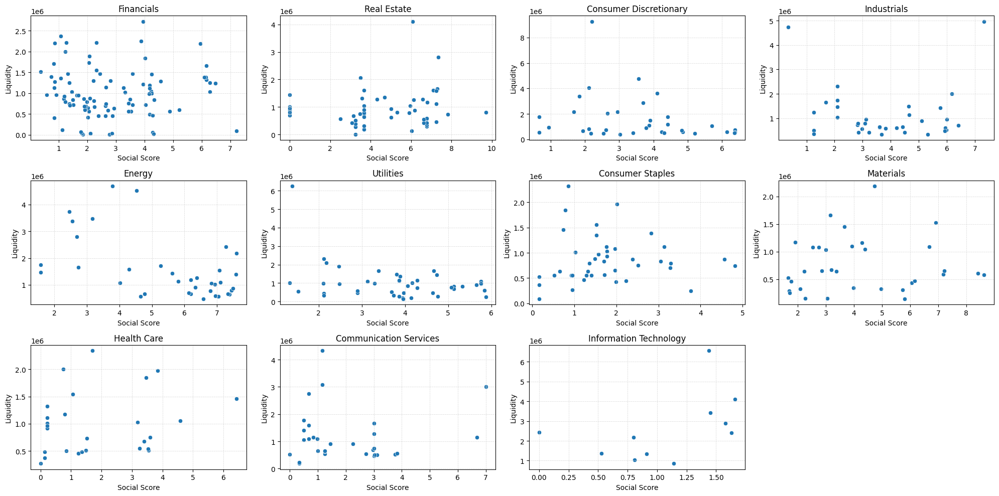

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

fig, axs = plt.subplots(3, 4, figsize=(20, 10))
axs = axs.flatten()

axs[11].axis('off')

for i, sector in enumerate(sectors):
    sector_data = df[df['sector'] == sector]
    sns.scatterplot(data=sector_data, x='esg_S', y='LIQUIDITY', ax=axs[i])
    axs[i].set_title(sector)
    axs[i].set_xlabel('Social Score')
    axs[i].set_ylabel('Liquidity')
    axs[i].grid(True, linestyle='--', linewidth=0.5, color='lightgray')

plt.tight_layout()  # Adjust layout for better spacing
plt.show()


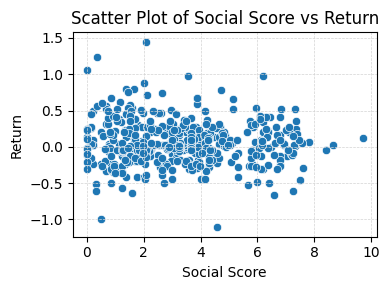

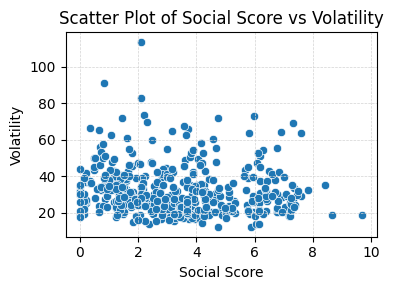

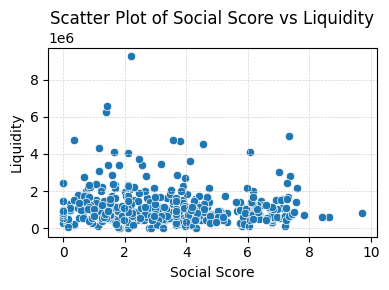

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(4, 3))
# Scatter plot ESG score against Return
sns.scatterplot(data=df, x='esg_S', y='RETURN')
plt.title('Scatter Plot of Social Score vs Return')
plt.xlabel('Social Score')
plt.ylabel('Return')
plt.grid(True, linestyle='--', linewidth=0.5, color='lightgray')
plt.tight_layout()  # Adjust layout for better spacing
plt.show()

plt.figure(figsize=(4, 3))
# Scatter plot ESG score against Volatility
sns.scatterplot(data=df, x='esg_S', y='VOLATILITY_260D_CALC')
plt.title('Scatter Plot of Social Score vs Volatility')
plt.xlabel('Social Score')
plt.ylabel('Volatility')
plt.grid(True, linestyle='--', linewidth=0.5, color='lightgray')
plt.tight_layout()  # Adjust layout for better spacing
plt.show()

plt.figure(figsize=(4, 3))
# Scatter plot ESG score against Volatility
sns.scatterplot(data=df, x='esg_S', y='LIQUIDITY')
plt.title('Scatter Plot of Social Score vs Liquidity')
plt.xlabel('Social Score')
plt.ylabel('Liquidity')
plt.grid(True, linestyle='--', linewidth=0.5, color='lightgray')
plt.tight_layout()  # Adjust layout for better spacing
plt.show()

##Governance score

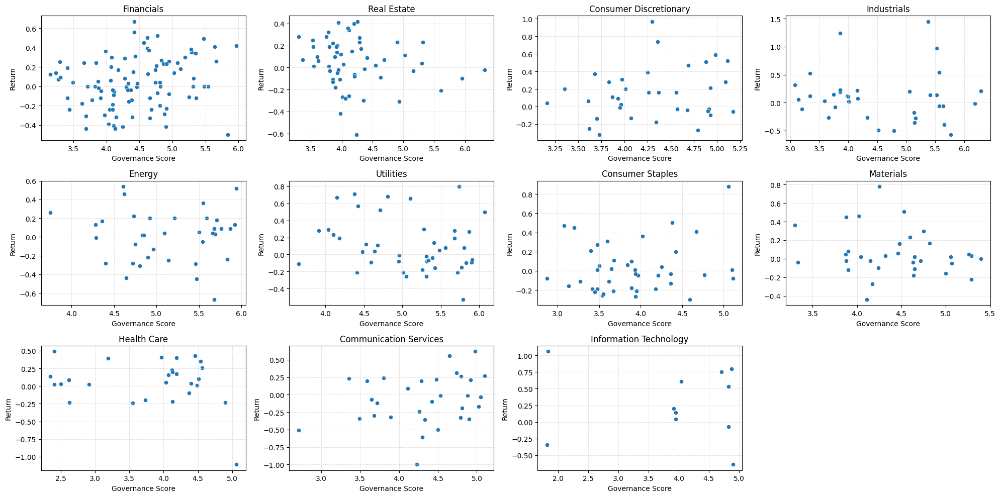

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

fig, axs = plt.subplots(3, 4, figsize=(20, 10))
axs = axs.flatten()

axs[11].axis('off')

for i, sector in enumerate(sectors):
    sector_data = df[df['sector'] == sector]
    sns.scatterplot(data=sector_data, x='esg_G', y='RETURN', ax=axs[i])
    axs[i].set_title(sector)
    axs[i].set_xlabel('Governance Score')
    axs[i].set_ylabel('Return')
    axs[i].grid(True, linestyle='--', linewidth=0.5, color='lightgray')

plt.tight_layout()  # Adjust layout for better spacing
plt.show()


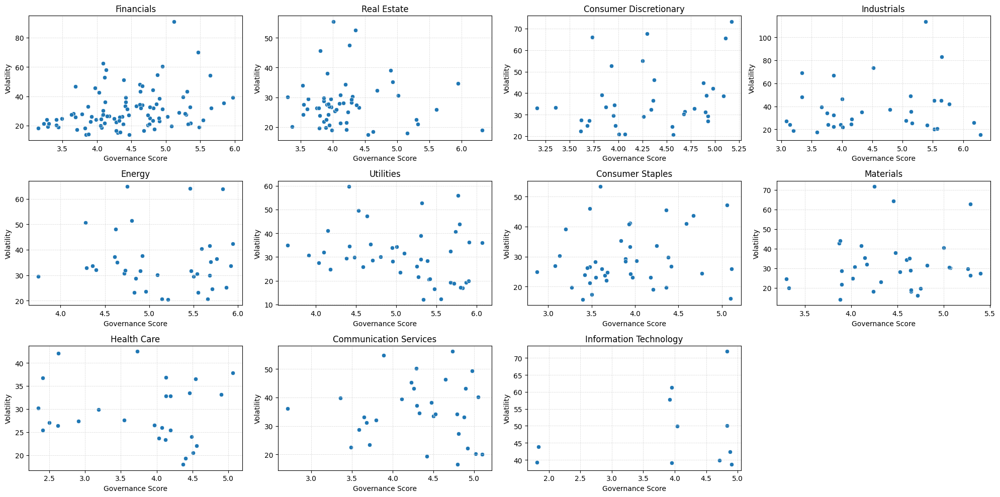

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

fig, axs = plt.subplots(3, 4, figsize=(20, 10))
axs = axs.flatten()

axs[11].axis('off')

for i, sector in enumerate(sectors):
    sector_data = df[df['sector'] == sector]
    sns.scatterplot(data=sector_data, x='esg_G', y='VOLATILITY_260D_CALC', ax=axs[i])
    axs[i].set_title(sector)
    axs[i].set_xlabel('Governance Score')
    axs[i].set_ylabel('Volatility')
    axs[i].grid(True, linestyle='--', linewidth=0.5, color='lightgray')

plt.tight_layout()  # Adjust layout for better spacing
plt.show()


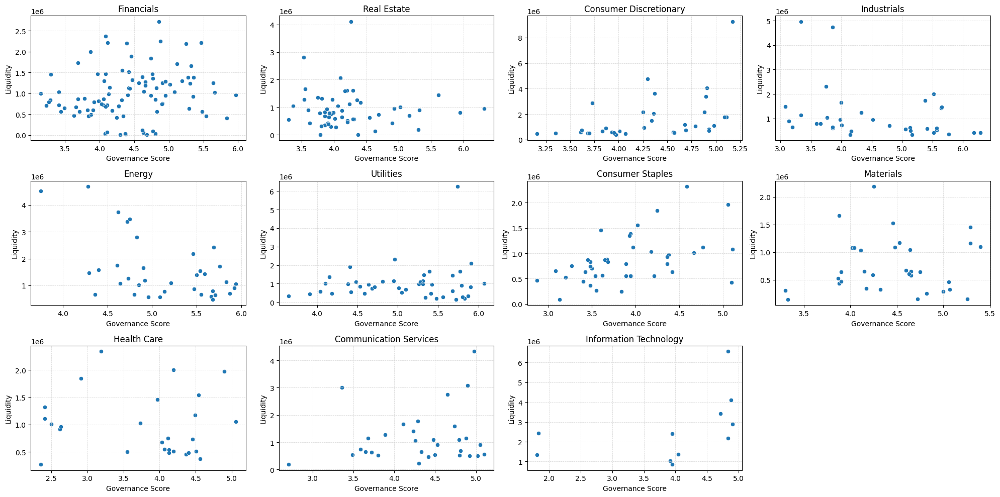

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

fig, axs = plt.subplots(3, 4, figsize=(20, 10))
axs = axs.flatten()

axs[11].axis('off')

for i, sector in enumerate(sectors):
    sector_data = df[df['sector'] == sector]
    sns.scatterplot(data=sector_data, x='esg_G', y='LIQUIDITY', ax=axs[i])
    axs[i].set_title(sector)
    axs[i].set_xlabel('Governance Score')
    axs[i].set_ylabel('Liquidity')
    axs[i].grid(True, linestyle='--', linewidth=0.5, color='lightgray')

plt.tight_layout()  # Adjust layout for better spacing
plt.show()


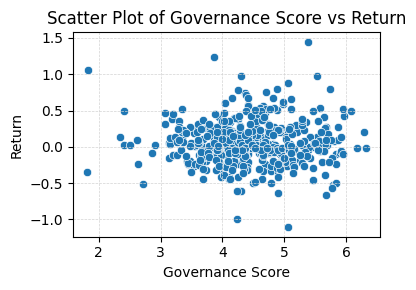

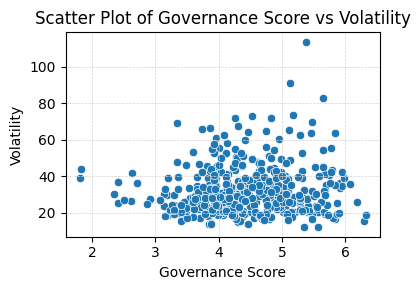

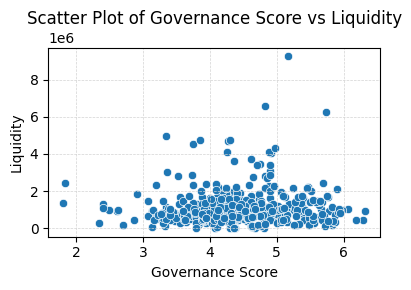

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(4, 3))
# Scatter plot ESG score against Return
sns.scatterplot(data=df, x='esg_G', y='RETURN')
plt.title('Scatter Plot of Governance Score vs Return')
plt.xlabel('Governance Score')
plt.ylabel('Return')
plt.grid(True, linestyle='--', linewidth=0.5, color='lightgray')
plt.tight_layout()  # Adjust layout for better spacing
plt.show()


plt.figure(figsize=(4, 3))
# Scatter plot ESG score against Volatility
sns.scatterplot(data=df, x='esg_G', y='VOLATILITY_260D_CALC')
plt.title('Scatter Plot of Governance Score vs Volatility')
plt.xlabel('Governance Score')
plt.ylabel('Volatility')
plt.grid(True, linestyle='--', linewidth=0.5, color='lightgray')
plt.tight_layout()  # Adjust layout for better spacing
plt.show()

plt.figure(figsize=(4, 3))
# Scatter plot ESG score against Volatility
sns.scatterplot(data=df, x='esg_G', y='LIQUIDITY')
plt.title('Scatter Plot of Governance Score vs Liquidity')
plt.xlabel('Governance Score')
plt.ylabel('Liquidity')
plt.grid(True, linestyle='--', linewidth=0.5, color='lightgray')
plt.tight_layout()  # Adjust layout for better spacing
plt.show()

# control variables

In [ ]:
df.columns

Index(['ID', 'sector', 'year', 'stringency_index', 'esg_OVERALL', 'esg_E',
       'esg_S', 'esg_G', 'RETURN', 'VOLATILITY_260D_CALC', 'ln_vol',
       'LIQUIDITY', 'ln_liq', 'BS_TOT_ASSET', 'ln_t_asset', 'RETURN_ON_ASSET',
       'TOT_DEBT_TO_COM_EQY', 'ln_debt', 'PX_TO_BOOK_RATIO', 'ln_ptb',
       'SALES_GROWTH', 'quintiles', 'quintiles_e', 'quintiles_s',
       'quintiles_g'],
      dtype='object')

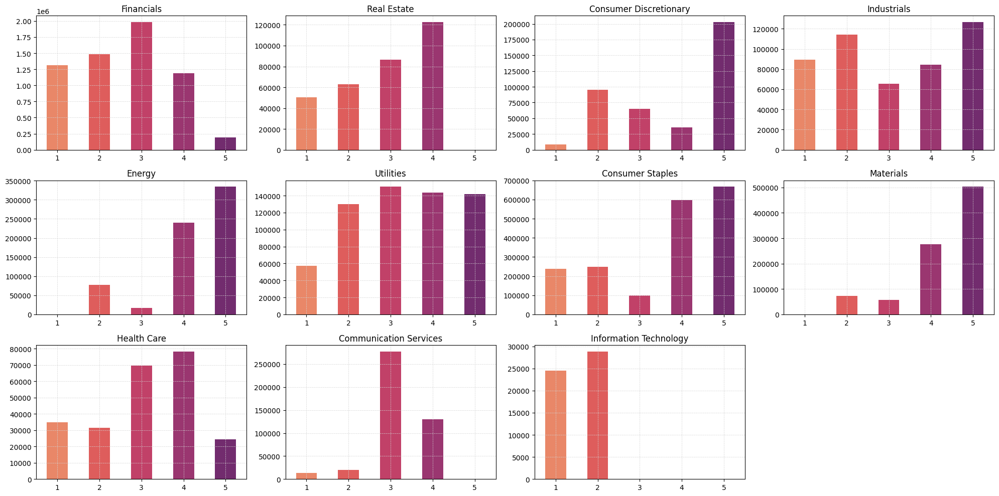

In [ ]:
import seaborn as sns

palette = sns.color_palette("flare", df['quintiles'].nunique())

fig, axs = plt.subplots(3, 4, figsize=(20, 10))
axs = axs.flatten()

axs[11].axis('off')

for i, sector in enumerate(sectors):
    sector_data = df[df['sector'] == sector].groupby('quintiles')['BS_TOT_ASSET'].mean()
    # Plot bar plot for each sector on the corresponding subplot
    sector_data.plot(kind='bar', ax=axs[i], color=palette, grid=True)
    axs[i].set_title(sector)
    axs[i].set_xlabel('')
    axs[i].xaxis.grid(True)
    axs[i].set_xticklabels(range(1,6), rotation=0)
    axs[i].grid(True, linestyle='--', linewidth=0.5, color='lightgray')

plt.tight_layout()  # Adjust layout for better spacing
plt.show()


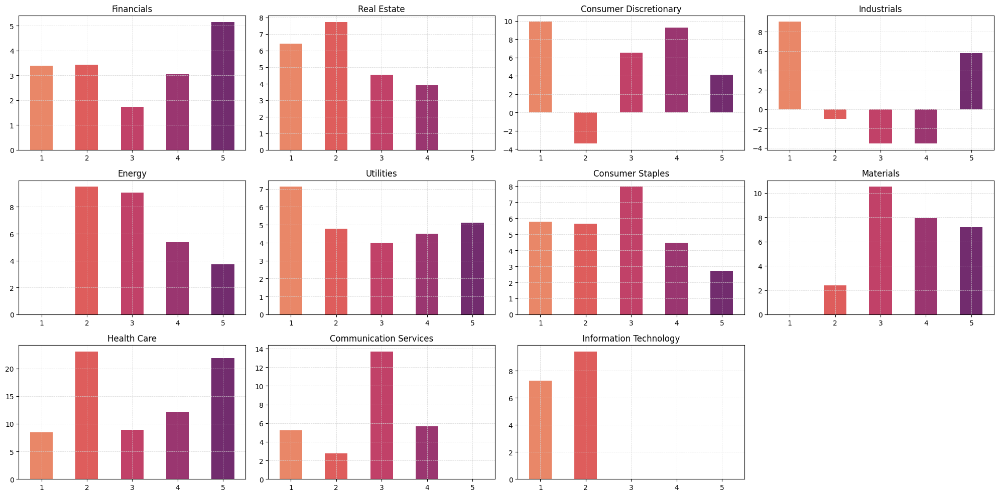

In [ ]:
import seaborn as sns

palette = sns.color_palette("flare", df['quintiles'].nunique())

fig, axs = plt.subplots(3, 4, figsize=(20, 10))
axs = axs.flatten()

axs[11].axis('off')

for i, sector in enumerate(sectors):
    sector_data = df[df['sector'] == sector].groupby('quintiles')['RETURN_ON_ASSET'].mean()
    # Plot bar plot for each sector on the corresponding subplot
    sector_data.plot(kind='bar', ax=axs[i], color=palette, grid=True)
    axs[i].set_title(sector)
    axs[i].set_xlabel('')
    axs[i].xaxis.grid(True)
    axs[i].set_xticklabels(range(1,6), rotation=0)
    axs[i].grid(True, linestyle='--', linewidth=0.5, color='lightgray')

plt.tight_layout()  # Adjust layout for better spacing
plt.show()


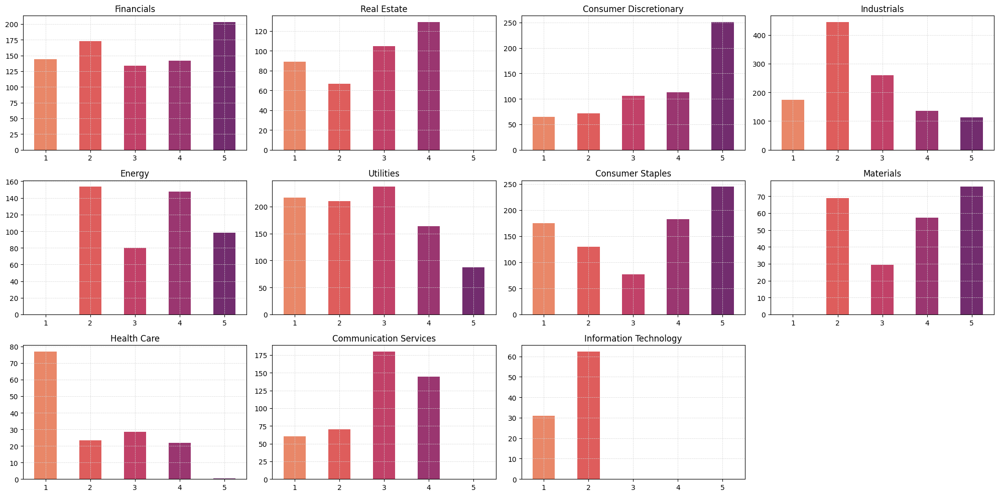

In [ ]:
import seaborn as sns

palette = sns.color_palette("flare", df['quintiles'].nunique())

fig, axs = plt.subplots(3, 4, figsize=(20, 10))
axs = axs.flatten()

axs[11].axis('off')

for i, sector in enumerate(sectors):
    sector_data = df[df['sector'] == sector].groupby('quintiles')['TOT_DEBT_TO_COM_EQY'].mean()
    sector_data.plot(kind='bar', ax=axs[i], color=palette, grid=True)
    axs[i].set_title(sector)
    axs[i].set_xlabel('')
    axs[i].xaxis.grid(True)
    axs[i].set_xticklabels(range(1,6), rotation=0)
    axs[i].grid(True, linestyle='--', linewidth=0.5, color='lightgray')

plt.tight_layout()  # Adjust layout for better spacing
plt.show()


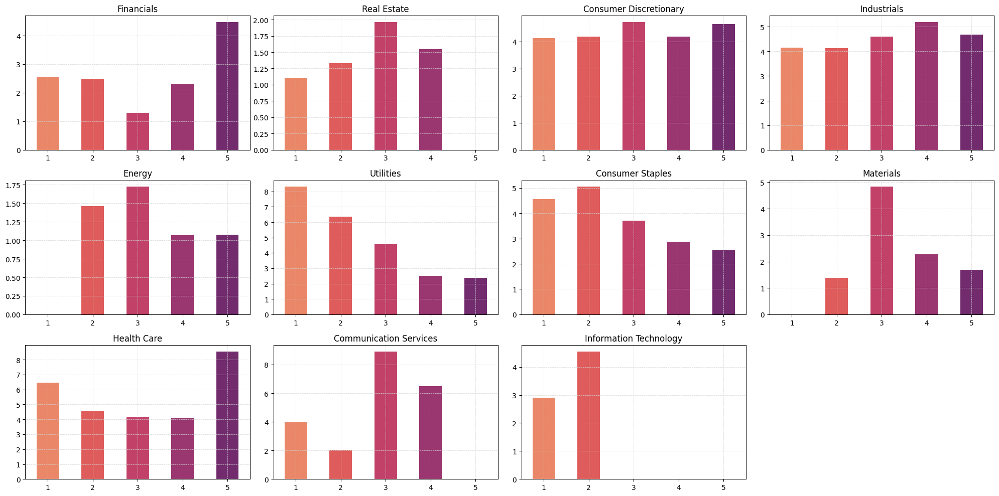

In [ ]:
import seaborn as sns

palette = sns.color_palette("flare", df['quintiles'].nunique())

fig, axs = plt.subplots(3, 4, figsize=(20, 10))
axs = axs.flatten()

axs[11].axis('off')

for i, sector in enumerate(sectors):
    sector_data = df[df['sector'] == sector].groupby('quintiles')['PX_TO_BOOK_RATIO'].mean()
    # Plot bar plot for each sector on the corresponding subplot
    sector_data.plot(kind='bar', ax=axs[i], color=palette, grid=True)
    axs[i].set_title(sector)
    axs[i].set_xlabel('')
    axs[i].xaxis.grid(True)
    axs[i].set_xticklabels(range(1,6), rotation=0)
    axs[i].grid(True, linestyle='--', linewidth=0.5, color='lightgray')

plt.tight_layout()  # Adjust layout for better spacing
plt.show()


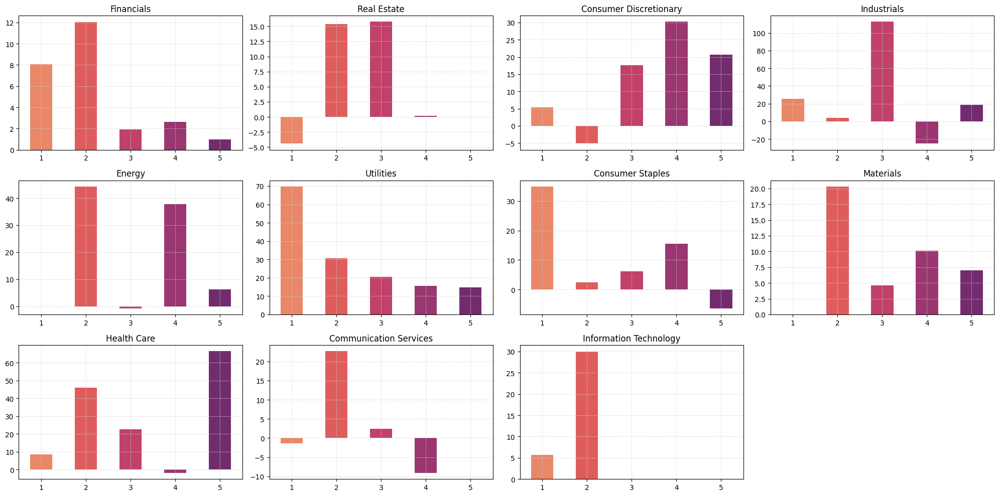

In [ ]:
import seaborn as sns

palette = sns.color_palette("flare", df['quintiles'].nunique())

fig, axs = plt.subplots(3, 4, figsize=(20, 10))
axs = axs.flatten()

axs[11].axis('off')

for i, sector in enumerate(sectors):
    # Group data by 'quintiles' and calculate the mean of 'RETURN'
    sector_data = df[df['sector'] == sector].groupby('quintiles')['SALES_GROWTH'].mean()
    # Plot bar plot for each sector on the corresponding subplot
    sector_data.plot(kind='bar', ax=axs[i], color=palette, grid=True)
    axs[i].set_title(sector)
    axs[i].set_xlabel('')
    axs[i].xaxis.grid(True)
    axs[i].set_xticklabels(range(1,6), rotation=0)
    axs[i].grid(True, linestyle='--', linewidth=0.5, color='lightgray')

plt.tight_layout()  # Adjust layout for better spacing
plt.show()

# distribution ❌

In [ ]:
import plotly.figure_factory as ff

hist_data = [esg_o, esg_e, esg_s, esg_g]
group_labels = ['Governance', 'Social', 'Environment','Overall']

# Create distplot with curve_type set to 'normal'
fig = ff.create_distplot(hist_data, group_labels,
                         bin_size=0.25, show_rug=False)

# Set the height and width of the plot
fig.update_layout(height=600, width=1000)
fig.show()


In [ ]:
df_esg = df[['esg_OVERALL', 'esg_E', 'esg_S', 'esg_G']].describe()
df_esg.columns = ['Overall', 'Environmental', 'Social', 'Governance']
df_esg_transposed = df_esg.transpose()
df_esg_transposed.round(2)

,count,mean,std,min,25%,50%,75%,max
Overall,444.0,3.04,1.33,0.56,2.01,2.89,3.84,6.59
Environmental,444.0,2.14,2.01,0.00,0.16,1.76,3.74,8.64
Social,444.0,3.34,2.08,0.00,1.65,3.14,4.65,9.70
Governance,444.0,4.42,0.76,1.81,3.91,4.37,4.93,6.32
